# problem - 1

### 1.	Perform clustering for the airlines data to obtain optimum number of clusters. Draw the inferences from the clusters obtained. Refer to EastWestAirlines.xlsx dataset.

**Objective(s):** 

**Constraints:** 


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
airlines = pd.read_excel(r"D:\360 Data Science 360DigiTMG\Day12-Dataset_Assignment Clustering\EastWestAirlines.xlsx",sheet_name='data')
airlines

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [3]:
airlines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID#                3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [4]:
airlines.describe()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3999.000000,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,2014.819455,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1160.764358,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,1.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1010.500000,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,2016.000000,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,3020.500000,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,4021.000000,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [5]:
airlines.isna().sum()

ID#                  0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [6]:
#check duplicates
airlines.duplicated().sum()

0

In [7]:
print(' Mean '.center(30,'#'),'\n')
print(airlines.mean())
print('\n')
print(' Median '.center(30,'#'),'\n')
print(airlines.median())
print('\n')
print(' Mode '.center(30,'#'),'\n')
print(airlines.mode())
print('\n')

############ Mean ############ 

ID#                   2014.819455
Balance              73601.327582
Qual_miles             144.114529
cc1_miles                2.059515
cc2_miles                1.014504
cc3_miles                1.012253
Bonus_miles          17144.846212
Bonus_trans             11.601900
Flight_miles_12mo      460.055764
Flight_trans_12          1.373593
Days_since_enroll     4118.559390
Award?                   0.370343
dtype: float64


########### Median ########### 

ID#                   2016.0
Balance              43097.0
Qual_miles               0.0
cc1_miles                1.0
cc2_miles                1.0
cc3_miles                1.0
Bonus_miles           7171.0
Bonus_trans             12.0
Flight_miles_12mo        0.0
Flight_trans_12          0.0
Days_since_enroll     4096.0
Award?                   0.0
dtype: float64


############ Mode ############ 

       ID#  Balance  Qual_miles  cc1_miles  cc2_miles  cc3_miles  Bonus_miles  \
0        1   1000.0         0.

In [8]:
print(' Standard deviation '.center(30,'#'),'\n')
print(airlines.std())
print('\n')
print(' Variance '.center(30,'#'),'\n')
print(airlines.var())
print('\n')

##### Standard deviation ##### 

ID#                    1160.764358
Balance              100775.664958
Qual_miles              773.663804
cc1_miles                 1.376919
cc2_miles                 0.147650
cc3_miles                 0.195241
Bonus_miles           24150.967826
Bonus_trans               9.603810
Flight_miles_12mo      1400.209171
Flight_trans_12           3.793172
Days_since_enroll      2065.134540
Award?                    0.482957
dtype: float64


########## Variance ########## 

ID#                  1.347374e+06
Balance              1.015573e+10
Qual_miles           5.985557e+05
cc1_miles            1.895907e+00
cc2_miles            2.180060e-02
cc3_miles            3.811896e-02
Bonus_miles          5.832692e+08
Bonus_trans          9.223317e+01
Flight_miles_12mo    1.960586e+06
Flight_trans_12      1.438816e+01
Days_since_enroll    4.264781e+06
Award?               2.332473e-01
dtype: float64




In [9]:
print(' Skewness '.center(30,'#'),'\n')
print(airlines.skew())
print('\n')

########## Skewness ########## 

ID#                  -0.003343
Balance               5.004187
Qual_miles            7.512395
cc1_miles             0.857569
cc2_miles            11.210459
cc3_miles            17.195532
Bonus_miles           2.842093
Bonus_trans           1.157362
Flight_miles_12mo     7.451666
Flight_trans_12       5.490461
Days_since_enroll     0.120174
Award?                0.537200
dtype: float64




In [10]:
print(' Kurtosis '.center(30,'#'),'\n')
print(airlines.kurt())
print('\n')

########## Kurtosis ########## 

ID#                   -1.199648
Balance               44.157932
Qual_miles            67.689351
cc1_miles             -0.748508
cc2_miles            133.786489
cc3_miles            308.654728
Bonus_miles           13.630489
Bonus_trans            2.745737
Flight_miles_12mo     94.761019
Flight_trans_12       42.978152
Days_since_enroll     -0.967505
Award?                -1.712272
dtype: float64




In [11]:
airlines.dtypes   

ID#                  int64
Balance              int64
Qual_miles           int64
cc1_miles            int64
cc2_miles            int64
cc3_miles            int64
Bonus_miles          int64
Bonus_trans          int64
Flight_miles_12mo    int64
Flight_trans_12      int64
Days_since_enroll    int64
Award?               int64
dtype: object

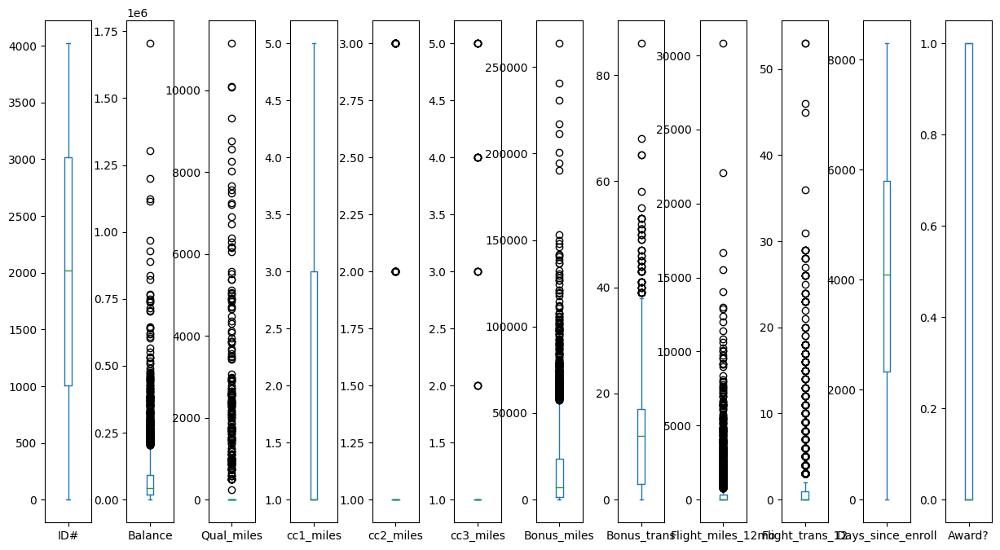

In [12]:
#univariate analysis
#find the outliers using box plot
airlines.plot(kind = 'box',subplots = True, sharey=False, figsize=(15,8))
plt.subplots_adjust(wspace=0.75)
plt.show()

(array([3.624e+03, 2.820e+02, 6.100e+01, 1.300e+01, 1.100e+01, 3.000e+00,
        2.000e+00, 2.000e+00, 0.000e+00, 1.000e+00]),
 array([      0. ,  170483.8,  340967.6,  511451.4,  681935.2,  852419. ,
        1022902.8, 1193386.6, 1363870.4, 1534354.2, 1704838. ]),
 <BarContainer object of 10 artists>)

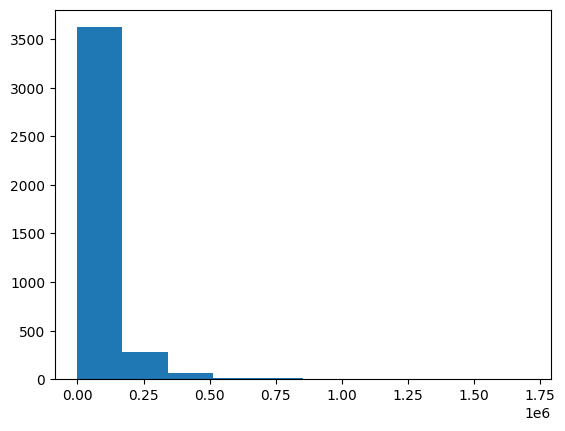

In [27]:
plt.hist(airlines.Balance)

(array([3.844e+03, 5.400e+01, 4.700e+01, 1.600e+01, 1.600e+01, 7.000e+00,
        7.000e+00, 4.000e+00, 1.000e+00, 3.000e+00]),
 array([    0. ,  1114.8,  2229.6,  3344.4,  4459.2,  5574. ,  6688.8,
         7803.6,  8918.4, 10033.2, 11148. ]),
 <BarContainer object of 10 artists>)

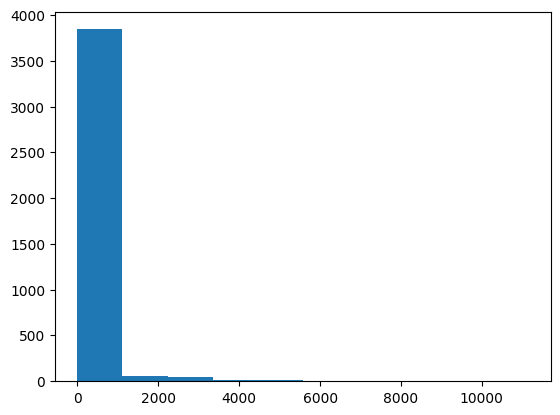

In [28]:
plt.hist(airlines.Qual_miles) 

(array([2289.,    0.,  284.,    0.,    0.,  613.,    0.,  525.,    0.,
         288.]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <BarContainer object of 10 artists>)

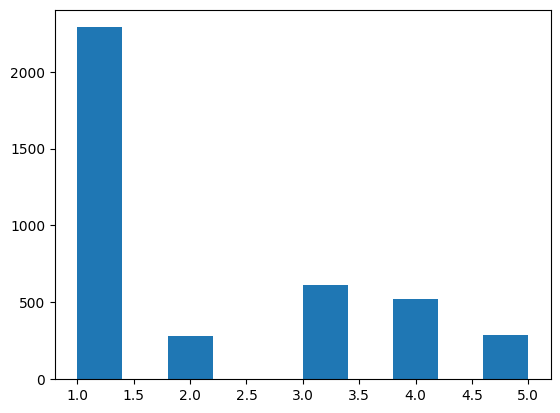

In [29]:
plt.hist(airlines.cc1_miles)

(array([3.981e+03, 0.000e+00, 3.000e+00, 0.000e+00, 0.000e+00, 4.000e+00,
        0.000e+00, 6.000e+00, 0.000e+00, 5.000e+00]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <BarContainer object of 10 artists>)

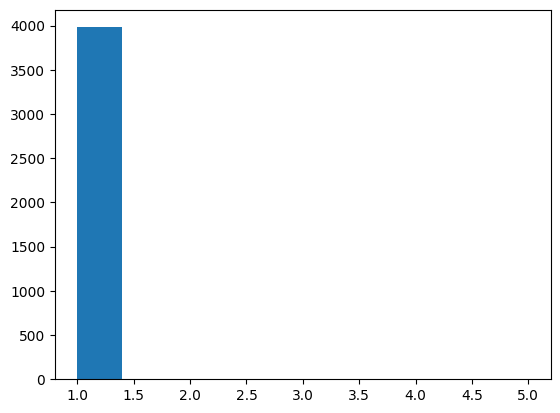

In [30]:
plt.hist(airlines.cc3_miles)

In [31]:
from feature_engine.outliers import Winsorizer

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='Balance'>

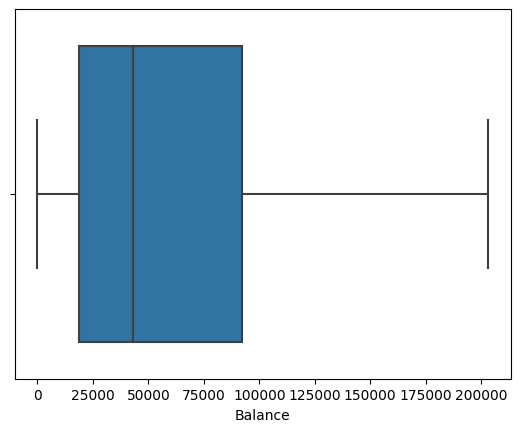

In [32]:
winsor = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Balance'])
airlines['Balance']= winsor.fit_transform(airlines[['Balance']])
sns.boxplot(airlines['Balance'])

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='Bonus_miles'>

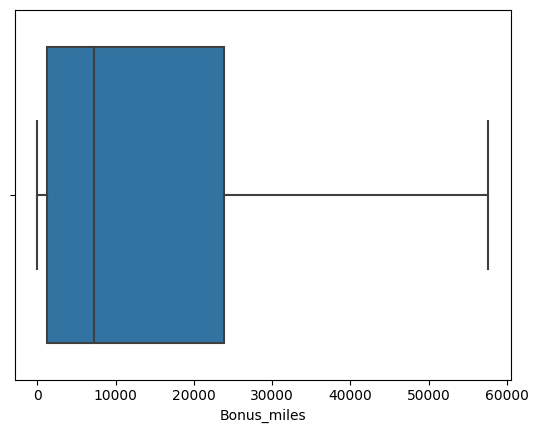

In [33]:
winsor = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Bonus_miles'])
airlines['Bonus_miles']= winsor.fit_transform(airlines[['Bonus_miles']])
sns.boxplot(airlines['Bonus_miles'])

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='Bonus_trans'>

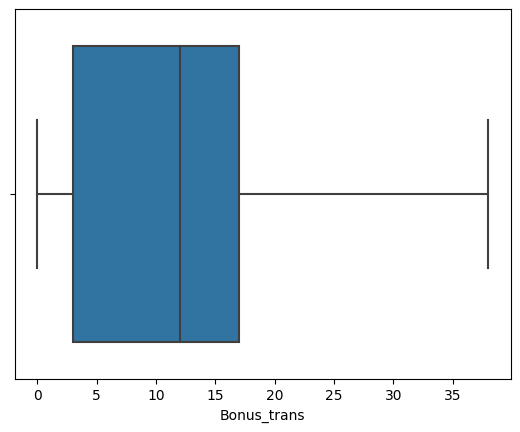

In [34]:
winsor = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Bonus_trans'])
airlines['Bonus_trans']= winsor.fit_transform(airlines[['Bonus_trans']])
sns.boxplot(airlines['Bonus_trans'])

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='Flight_miles_12mo'>

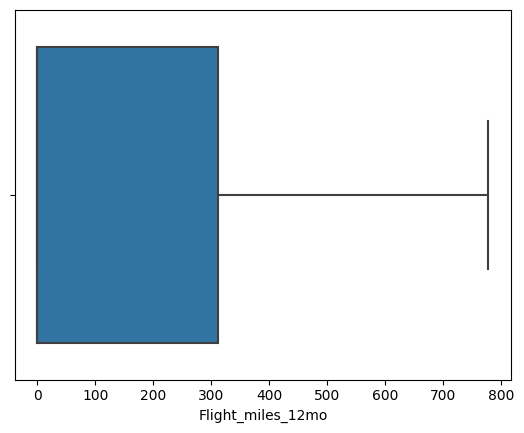

In [35]:
winsor = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Flight_miles_12mo'])
airlines['Flight_miles_12mo']= winsor.fit_transform(airlines[['Flight_miles_12mo']])
sns.boxplot(airlines['Flight_miles_12mo'])

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='Flight_trans_12'>

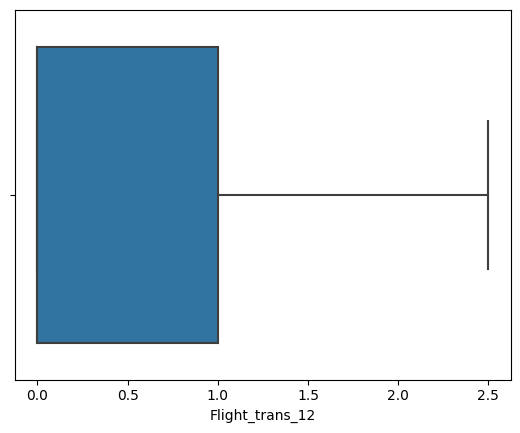

In [37]:
winsor = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Flight_trans_12'])
airlines['Flight_trans_12']= winsor.fit_transform(airlines[['Flight_trans_12']])
sns.boxplot(airlines['Flight_trans_12'])

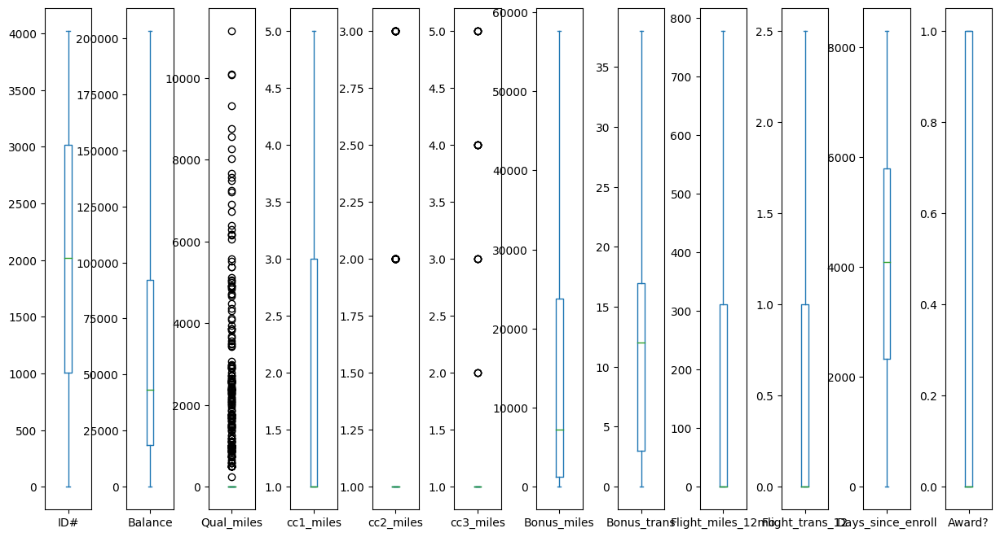

In [38]:
#find is there any outliers after winsorization using box plot
airlines.plot(kind = 'box',subplots = True, sharey=False, figsize=(15,8))
plt.subplots_adjust(wspace=0.75)
plt.show()

In [39]:
#zero and near zero variance
airlines.var()    # We dont have any values with near zero (or) zero variance. 
                   #We can proceed with further data preprocessing steps

ID#                  1.347374e+06
Balance              3.442603e+09
Qual_miles           5.985557e+05
cc1_miles            1.895907e+00
cc2_miles            2.180060e-02
cc3_miles            3.811896e-02
Bonus_miles          3.266960e+08
Bonus_trans          8.308512e+01
Flight_miles_12mo    8.683514e+04
Flight_trans_12      8.926970e-01
Days_since_enroll    4.264781e+06
Award?               2.332473e-01
dtype: float64

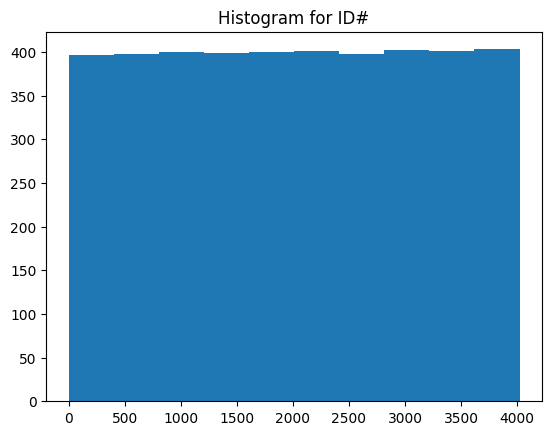

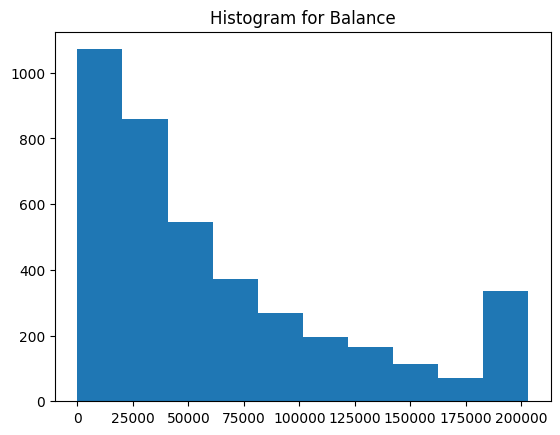

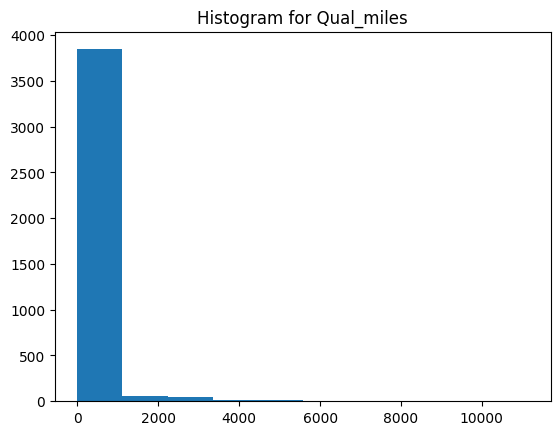

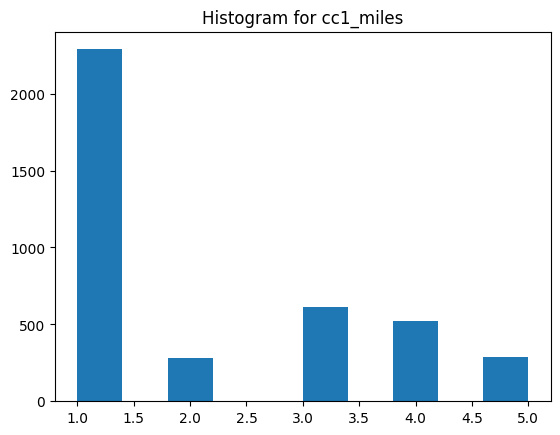

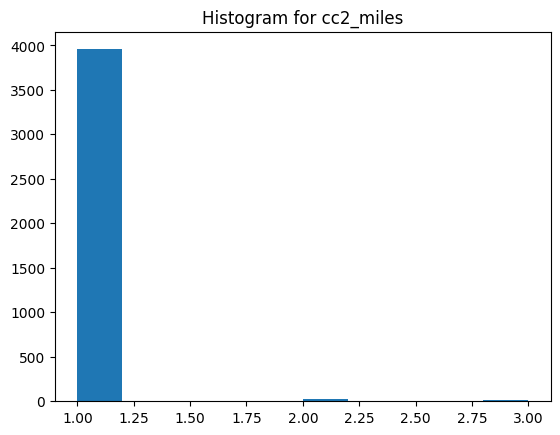

...

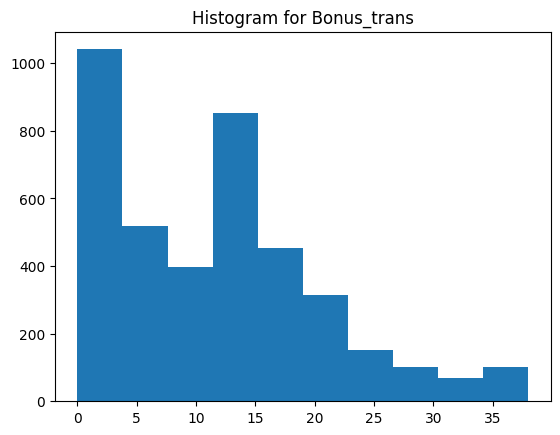

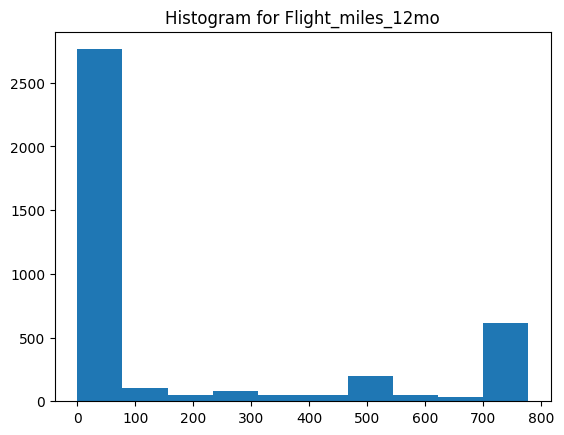

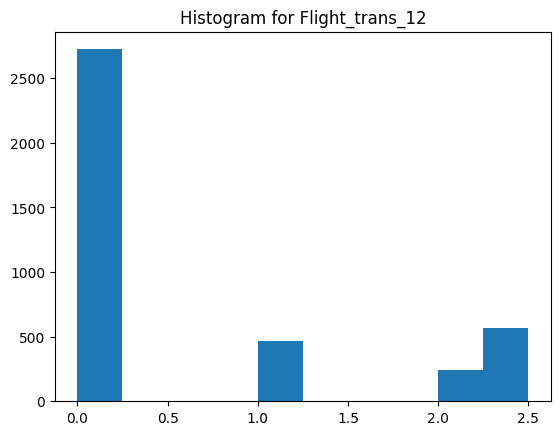

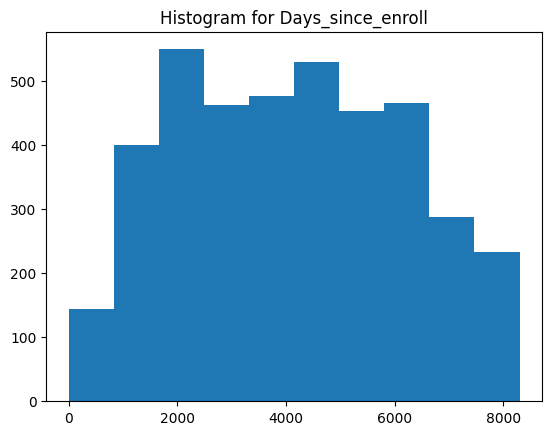

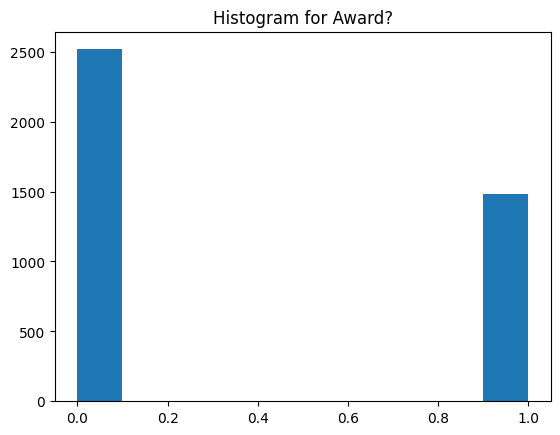

In [41]:
#graphical representation
# Histogram describes the spread of data

for i in airlines.columns:
  plt.hist(x = airlines[i])
  plt.title("Histogram for " + str(i))
  plt.show()


C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='Balance', ylabel='Qual_miles'>

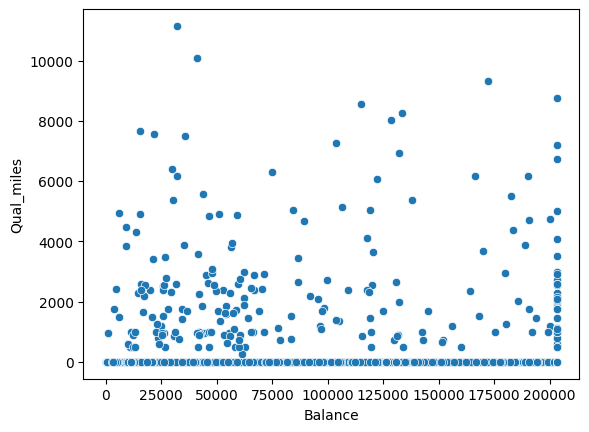

In [53]:
#Bivariate Analysis
sns.scatterplot(airlines["Balance"],airlines["Qual_miles"])

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='cc1_miles', ylabel='cc2_miles'>

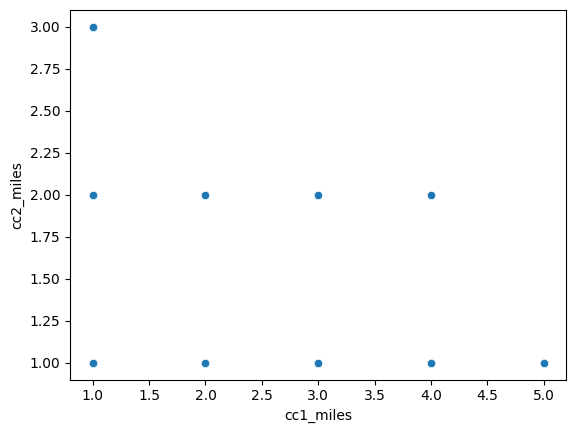

In [54]:
sns.scatterplot(airlines["cc1_miles"],airlines["cc2_miles"])

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='cc3_miles', ylabel='Bonus_miles'>

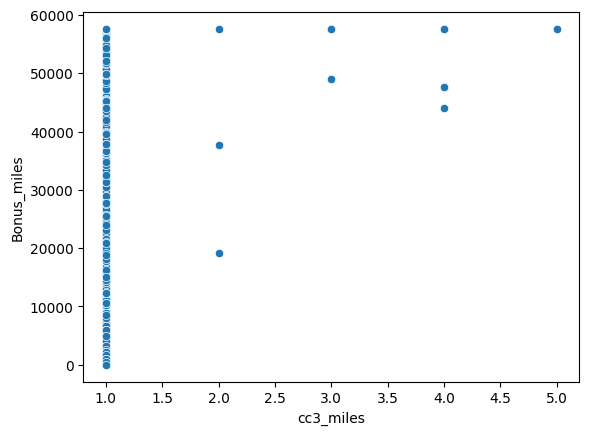

In [55]:
sns.scatterplot(airlines["cc3_miles"],airlines["Bonus_miles"])

In [57]:
#normalization function
def norm_func(i):
    x = (i-i.min()) / (i.max()-i.min())
    return(x)

In [59]:
df_norm = norm_func(airlines.iloc[:, 0:])

In [60]:
df_norm.describe()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000
mean,0.500950,0.313793,0.012927,0.264879,0.007252,0.003063,0.267426,0.301858,0.229010,0.236609,0.496330,0.370343
std,0.288747,0.288722,0.069399,0.344230,0.073825,0.048810,0.313655,0.239871,0.379007,0.377931,0.248991,0.482957
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.251119,0.091170,0.000000,0.000000,0.000000,0.000000,0.021692,0.078947,0.000000,0.000000,0.280685,0.000000
50%,0.501244,0.212072,0.000000,0.000000,0.000000,0.000000,0.124440,0.315789,0.000000,0.000000,0.493610,0.000000
75%,0.751119,0.454702,0.000000,0.500000,0.000000,0.000000,0.413015,0.447368,0.400000,0.400000,0.697914,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [61]:
airlines.columns

Index(['ID#', 'Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'Award?'],
      dtype='object')

In [62]:
#clustering model building
from scipy.cluster.hierarchy import linkage,dendrogram
from sklearn.cluster import AgglomerativeClustering

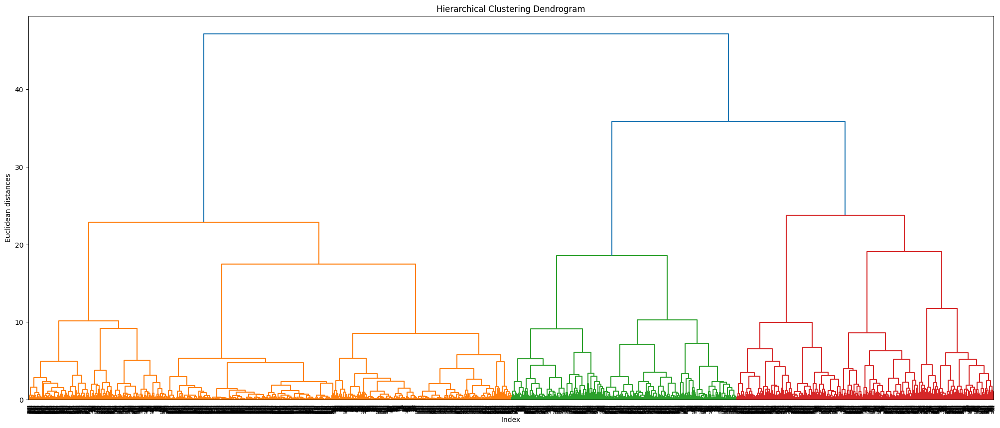

In [65]:
plt.figure(1, figsize = (25, 10))
tree_plot = dendrogram(linkage(df_norm, method  = "ward"))

plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Index')
plt.ylabel('Euclidean distances')
plt.show()

In [67]:
# Applying AgglomerativeClustering choosing 3 as clusters from the above dendrogram
hc1 = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'complete')

y_hc1 = hc1.fit_predict(df_norm)
y_hc1

array([2, 2, 2, ..., 2, 1, 2], dtype=int64)

In [70]:
# Applying AgglomerativeClustering choosing 3 as clusters from the above dendrogram
hc2 = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'average')

y_hc2 = hc2.fit_predict(df_norm)
y_hc2

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [71]:
hc3 = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'single')

y_hc3 = hc3.fit_predict(df_norm)
y_hc3

array([0, 0, 0, ..., 2, 0, 0], dtype=int64)

In [72]:
hc1.labels_   # Refering to the results obtained from linkage = 'complete' method

array([2, 2, 2, ..., 2, 1, 2], dtype=int64)

In [73]:
cluster_labels = pd.Series(hc1.labels_)

In [75]:
# Add Cluster labels to orignal Dataset

airlines['cluster'] = cluster_labels
airlines.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust,cluster
0,1,28143.0,0,1,1,1,174.0,1.0,0.0,0.0,7000,0,2,2
1,2,19244.0,0,1,1,1,215.0,2.0,0.0,0.0,6968,0,2,2
2,3,41354.0,0,1,1,1,4123.0,4.0,0.0,0.0,7034,0,2,2
3,4,14776.0,0,1,1,1,500.0,1.0,0.0,0.0,6952,0,2,2
4,5,97752.0,0,4,1,1,43300.0,26.0,777.5,2.5,6935,1,0,0


In [77]:
#cluster evaluation
airlines.head() # The final dataframe with cluster ID's

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust,cluster
0,1,28143.0,0,1,1,1,174.0,1.0,0.0,0.0,7000,0,2,2
1,2,19244.0,0,1,1,1,215.0,2.0,0.0,0.0,6968,0,2,2
2,3,41354.0,0,1,1,1,4123.0,4.0,0.0,0.0,7034,0,2,2
3,4,14776.0,0,1,1,1,500.0,1.0,0.0,0.0,6952,0,2,2
4,5,97752.0,0,4,1,1,43300.0,26.0,777.5,2.5,6935,1,0,0


In [79]:
airlines1 = airlines.sort_values(by = 'cluster')
airlines1

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust,cluster
1999,2016,203218.75,1452,5,1,1,57626.25,25.0,350.0,2.5,4440,1,0,0
3079,3101,142929.00,0,4,1,1,40826.00,23.0,0.0,0.0,2803,0,0,0
1733,1749,203218.75,0,5,1,1,57626.25,18.0,777.5,2.0,4545,1,0,0
725,735,151904.00,733,5,1,1,57626.25,25.0,777.5,2.5,6273,1,0,0
1728,1744,199418.00,1000,3,1,1,25590.00,38.0,777.5,2.5,4548,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1812,1829,21915.00,0,1,1,1,7000.00,33.0,0.0,0.0,4289,0,2,2
1813,1830,32563.00,0,1,1,1,4200.00,3.0,200.0,1.0,4282,0,2,2
1814,1831,49479.00,0,1,1,1,5500.00,24.0,100.0,1.0,4282,0,2,2
1817,1834,75112.00,0,4,1,1,35532.00,14.0,500.0,1.0,4271,0,2,2


In [81]:
#Aggregate the mean of each cluster
airlines.iloc[: ,0:].groupby(airlines.clust).mean() 

,clust,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
clust,,,,,,,,,,,,,
0,0.0,1464.220207,119646.620790,180.655440,4.244819,1.002591,1.053109,45647.853627,21.002591,294.187176,0.959197,5118.572539,0.630829
1,1.0,2084.149935,73635.515319,313.444589,1.428944,1.020860,1.000000,10027.320404,11.650587,597.919166,1.935463,4038.674055,0.504563
2,2.0,2165.992683,43156.562195,79.852033,1.570325,1.016260,1.003252,7600.168394,8.423171,10.702439,0.057114,3829.641463,0.246748


In [82]:
cluster0 = airlines1.loc[(airlines1.cluster == 0), :]
cluster0

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust,cluster
1999,2016,203218.75,1452,5,1,1,57626.25,25.0,350.0,2.5,4440,1,0,0
3079,3101,142929.00,0,4,1,1,40826.00,23.0,0.0,0.0,2803,0,0,0
1733,1749,203218.75,0,5,1,1,57626.25,18.0,777.5,2.0,4545,1,0,0
725,735,151904.00,733,5,1,1,57626.25,25.0,777.5,2.5,6273,1,0,0
1728,1744,199418.00,1000,3,1,1,25590.00,38.0,777.5,2.5,4548,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2888,2910,78317.00,0,3,1,1,34282.00,35.0,777.5,2.5,1859,1,0,0
2163,2180,60076.00,0,4,1,1,45582.00,9.0,0.0,0.0,3935,0,0,0
3834,3857,101431.00,0,4,1,1,49801.00,19.0,0.0,0.0,1677,0,0,0
465,471,203218.75,0,5,1,1,57626.25,34.0,777.5,2.5,8228,1,0,0


In [83]:
cluster1 = airlines1.loc[(airlines1.cluster == 1), :]
cluster1

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust,cluster
2637,2657,145214.0,1692,1,1,1,3500.0,4.0,500.0,1.0,2560,1,1,1
3363,3386,61479.0,0,1,1,1,6050.0,4.0,50.0,1.0,1755,0,1,1
3260,3283,194111.0,0,1,1,1,12350.0,30.0,777.5,2.5,1777,1,1,1
2943,2965,43510.0,0,1,1,1,4850.0,6.0,350.0,2.0,3328,0,1,1
2401,2420,24100.0,0,3,1,1,26674.0,23.0,777.5,2.5,3421,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,517,9800.0,589,1,1,1,10348.0,34.0,777.5,2.5,6651,1,1,1
3733,3756,25730.0,0,1,1,1,1431.0,3.0,777.5,2.0,630,0,1,1
3414,3437,21854.0,0,1,1,1,500.0,1.0,500.0,1.0,1100,0,1,1
42,43,60313.0,0,1,1,1,10000.0,26.0,777.5,2.5,7829,1,1,1


In [84]:
cluster2 = airlines1.loc[(airlines1.cluster == 2), :]
cluster2

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust,cluster
2804,2826,60856.0,0,2,1,1,17332.0,8.0,0.0,0.0,2076,0,2,2
2810,2832,50783.0,0,3,1,1,11595.0,15.0,0.0,0.0,2060,0,2,2
2808,2830,76909.0,0,3,1,1,18405.0,12.0,0.0,0.0,2066,0,2,2
2805,2827,15526.0,0,1,1,1,2750.0,15.0,0.0,0.0,2063,0,2,2
2812,2834,41275.0,0,1,1,1,0.0,0.0,0.0,0.0,2035,0,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1812,1829,21915.0,0,1,1,1,7000.0,33.0,0.0,0.0,4289,0,2,2
1813,1830,32563.0,0,1,1,1,4200.0,3.0,200.0,1.0,4282,0,2,2
1814,1831,49479.0,0,1,1,1,5500.0,24.0,100.0,1.0,4282,0,2,2
1817,1834,75112.0,0,4,1,1,35532.0,14.0,500.0,1.0,4271,0,2,2


In [85]:
#creating a csv file
airlines.to_csv("new_airlines.csv", encoding = "utf-8")
import os
os.getcwd()

'C:\\Users\\J. Berger Perkins\\anaconda3'

# problem - 2

### 2.	Perform clustering for the crime data and identify the number of clusters            formed and draw inferences. Refer to crime_data.csv dataset.

Data dictionary:
- the crime data set contain 50 cities name
- four features are used for each cities

description:

- Unnamed: 0 - name of cities in the world
- murder - %total people killed in cities
- assault - attacked by some people
- urbanpop - population of cities
- rape - % total people get raped or harressed

In [52]:
#importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [53]:
#reading the data into pyhton
df = pd.read_csv(r"D:\360 Data Science 360DigiTMG\Day12-Dataset_Assignment Clustering\crime_data.csv")
df

,Unnamed: 0,Murder,Assault,UrbanPop,Rape
0,Alabama,13.2,236,58,21.2
1,Alaska,10.0,263,48,44.5
2,Arizona,8.1,294,80,31.0
3,Arkansas,8.8,190,50,19.5
4,California,9.0,276,91,40.6
5,Colorado,7.9,204,78,38.7
6,Connecticut,3.3,110,77,11.1
7,Delaware,5.9,238,72,15.8
8,Florida,15.4,335,80,31.9
9,Georgia,17.4,211,60,25.8


In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  50 non-null     object 
 1   Murder      50 non-null     float64
 2   Assault     50 non-null     int64  
 3   UrbanPop    50 non-null     int64  
 4   Rape        50 non-null     float64
dtypes: float64(2), int64(2), object(1)
memory usage: 2.1+ KB


In [55]:
#statistical analysis EDA
df.describe()

,Murder,Assault,UrbanPop,Rape
count,50.00000,50.000000,50.000000,50.000000
mean,7.78800,170.760000,65.540000,21.232000
std,4.35551,83.337661,14.474763,9.366385
min,0.80000,45.000000,32.000000,7.300000
25%,4.07500,109.000000,54.500000,15.075000
50%,7.25000,159.000000,66.000000,20.100000
75%,11.25000,249.000000,77.750000,26.175000
max,17.40000,337.000000,91.000000,46.000000


In [56]:
#first moment of business decission
print(' Mean '.center(50,'#'))
print(df.mean())
print('\n')
print(' Median '.center(50,'#'))
print(df.median())
print('\n')
print(' Mode '.center(50,'#'))
print(df.mode())

###################### Mean ######################
Murder        7.788
Assault     170.760
UrbanPop     65.540
Rape         21.232
dtype: float64


##################### Median #####################
Murder        7.25
Assault     159.00
UrbanPop     66.00
Rape         20.10
dtype: float64


###################### Mode ######################
        Unnamed: 0  Murder  Assault  UrbanPop  Rape
0          Alabama     2.1    120.0      66.0  14.9
1           Alaska     2.2      NaN      80.0  16.3
2          Arizona     2.6      NaN       NaN   NaN
3         Arkansas     6.0      NaN       NaN   NaN
4       California     9.0      NaN       NaN   NaN
5         Colorado    13.2      NaN       NaN   NaN
6      Connecticut    15.4      NaN       NaN   NaN
7         Delaware     NaN      NaN       NaN   NaN
8          Florida     NaN      NaN       NaN   NaN
9          Georgia     NaN      NaN       NaN   NaN
10          Hawaii     NaN      NaN       NaN   NaN
11           Idaho     NaN      N

C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13692\3824003402.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print(df.mean())
C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13692\3824003402.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print(df.median())


In [58]:
#second moment of business decision
print(' Variance '.center(50,'#'))
print(df.var())
print('\n')
print(' Standard Deviation '.center(50,'#'))
print(df.std())

#################### Variance ####################
Murder        18.970465
Assault     6945.165714
UrbanPop     209.518776
Rape          87.729159
dtype: float64


############### Standard Deviation ###############
Murder       4.355510
Assault     83.337661
UrbanPop    14.474763
Rape         9.366385
dtype: float64


C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13692\2822506973.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print(df.var())
C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13692\2822506973.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print(df.std())


In [59]:
#third moment of business decission
print(' Skewnwss '.center(50,'#'))
print(df.skew())

#################### Skewnwss ####################
Murder      0.393956
Assault     0.234410
UrbanPop   -0.226009
Rape        0.801200
dtype: float64


C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13692\1597746948.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print(df.skew())


In [60]:
#fourth momennt of business decission
print(' Kurtosis '.center(50,'#'))
print(df.kurt())

#################### Kurtosis ####################
Murder     -0.827488
Assault    -1.053848
UrbanPop   -0.738360
Rape        0.353964
dtype: float64


C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13692\3172212520.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print(df.kurt())


In [61]:
df = df.rename(columns={'Unnamed: 0':'State'})
print(df)

             State  Murder  Assault  UrbanPop  Rape
0          Alabama    13.2      236        58  21.2
1           Alaska    10.0      263        48  44.5
2          Arizona     8.1      294        80  31.0
3         Arkansas     8.8      190        50  19.5
4       California     9.0      276        91  40.6
5         Colorado     7.9      204        78  38.7
6      Connecticut     3.3      110        77  11.1
7         Delaware     5.9      238        72  15.8
8          Florida    15.4      335        80  31.9
9          Georgia    17.4      211        60  25.8
10          Hawaii     5.3       46        83  20.2
11           Idaho     2.6      120        54  14.2
12        Illinois    10.4      249        83  24.0
13         Indiana     7.2      113        65  21.0
14            Iowa     2.2       56        57  11.3
15          Kansas     6.0      115        66  18.0
16        Kentucky     9.7      109        52  16.3
17       Louisiana    15.4      249        66  22.2
18          

In [62]:
#data preprocessing

#descriptive statistics
df.describe()

,Murder,Assault,UrbanPop,Rape
count,50.00000,50.000000,50.000000,50.000000
mean,7.78800,170.760000,65.540000,21.232000
std,4.35551,83.337661,14.474763,9.366385
min,0.80000,45.000000,32.000000,7.300000
25%,4.07500,109.000000,54.500000,15.075000
50%,7.25000,159.000000,66.000000,20.100000
75%,11.25000,249.000000,77.750000,26.175000
max,17.40000,337.000000,91.000000,46.000000


In [63]:
#to check the data types of the variable
df.dtypes 

State        object
Murder      float64
Assault       int64
UrbanPop      int64
Rape        float64
dtype: object

In [64]:
#handling duplicates
## Returns Boolean Series denoting duplicate rows.

duplicates = df.duplicated()
print(duplicates)
sum(duplicates)

0     False
1     False
2     False
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
20    False
21    False
22    False
23    False
24    False
25    False
26    False
27    False
28    False
29    False
30    False
31    False
32    False
33    False
34    False
35    False
36    False
37    False
38    False
39    False
40    False
41    False
42    False
43    False
44    False
45    False
46    False
47    False
48    False
49    False
dtype: bool


0

In [66]:
#missing value analysis

# check any null or nan values present
df.isnull().sum()

State       0
Murder      0
Assault     0
UrbanPop    0
Rape        0
dtype: int64

In [67]:
#outlier analysis
# before doin outlier analysis make the categorical and numerical value seperated
df_cat = df.iloc[: , :1]
df_cat.head()

,State
0,Alabama
1,Alaska
2,Arizona
3,Arkansas
4,California


In [68]:
df_num = df.iloc[: , 1:]
df_num.head()

,Murder,Assault,UrbanPop,Rape
0,13.2,236,58,21.2
1,10.0,263,48,44.5
2,8.1,294,80,31.0
3,8.8,190,50,19.5
4,9.0,276,91,40.6


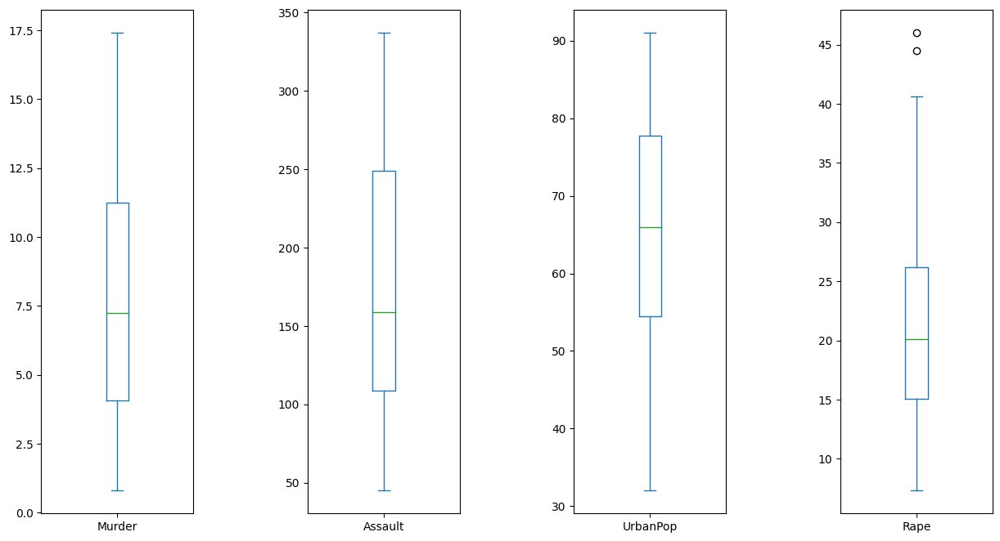

In [69]:
#use boxplot to visualise is there any outlier
df_num.plot(kind='box',subplots=True,sharey=False,figsize=(15,8))
plt.subplots_adjust(wspace=0.75)
plt.show()

In [70]:
#in rape column there is some presence of outlier
#for outlier we can use winsorizer method to treat it
from feature_engine.outliers import Winsorizer

In [71]:
winsor = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Rape'])
df_num['Rape'] = winsor.fit_transform(df_num[['Rape']])

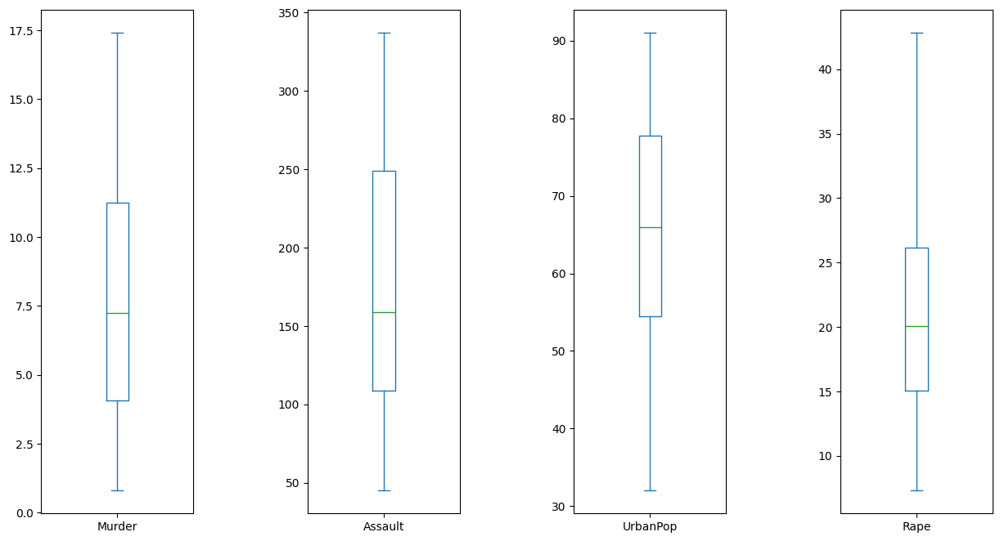

In [72]:
#verify the boxplot to visualise is there any outlier
df_num.plot(kind='box',subplots=True,sharey=False,figsize=(15,8))
plt.subplots_adjust(wspace=0.75)
plt.show()

In [73]:
#zero and near zero variance
df_num.var()

Murder        18.970465
Assault     6945.165714
UrbanPop     209.518776
Rape          83.182041
dtype: float64

In [74]:
df_num.var()==0  # hence there no near zero variance we can proceed with next steps

Murder      False
Assault     False
UrbanPop    False
Rape        False
dtype: bool

In [75]:
# Dummy variable creation
# verify the data types of the fields for entire data
df.dtypes

State        object
Murder      float64
Assault       int64
UrbanPop      int64
Rape        float64
dtype: object

In [76]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50 entries, 0 to 49
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   State   50 non-null     object
dtypes: object(1)
memory usage: 800.0+ bytes


In [78]:
df_cat['State'].unique()
print('\n')
df_cat['State'].value_counts()

Alabama           1
Pennsylvania      1
Nevada            1
New Hampshire     1
New Jersey        1
New Mexico        1
New York          1
North Carolina    1
North Dakota      1
Ohio              1
Oklahoma          1
Oregon            1
Rhode Island      1
Alaska            1
South Carolina    1
South Dakota      1
Tennessee         1
Texas             1
Utah              1
Vermont           1
Virginia          1
Washington        1
West Virginia     1
Wisconsin         1
Nebraska          1
Montana           1
Missouri          1
Mississippi       1
Arizona           1
Arkansas          1
California        1
Colorado          1
Connecticut       1
Delaware          1
Florida           1
Georgia           1
Hawaii            1
Idaho             1
Illinois          1
Indiana           1
Iowa              1
Kansas            1
Kentucky          1
Louisiana         1
Maine             1
Maryland          1
Massachusetts     1
Michigan          1
Minnesota         1
Wyoming           1


here 'State'  is the identity and does not need dummy variabes

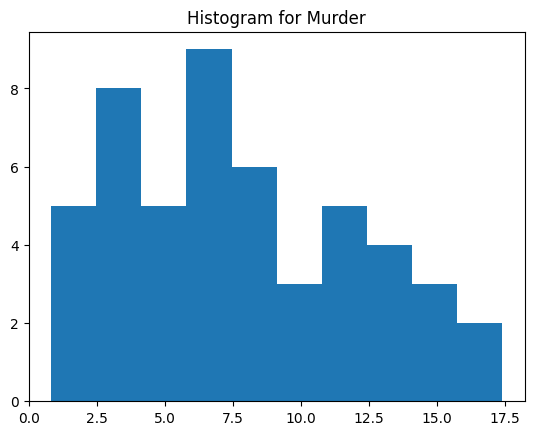

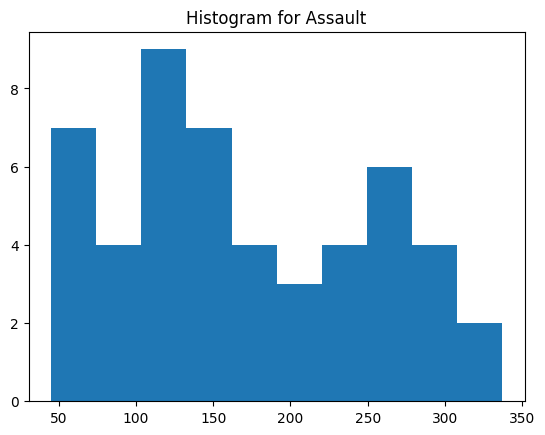

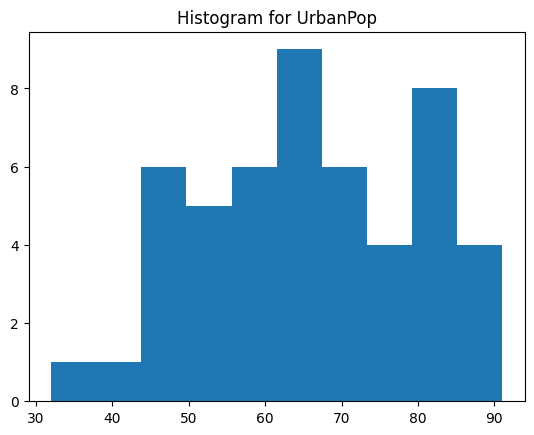

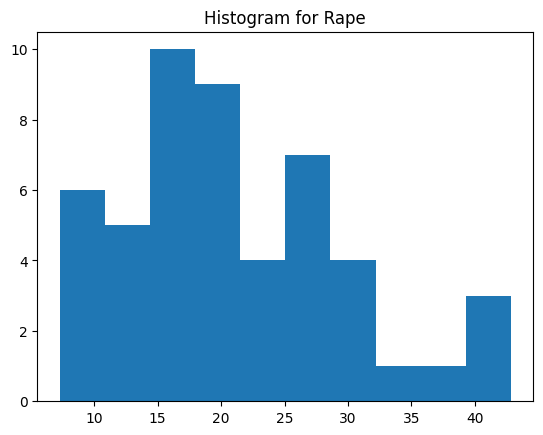

In [79]:
#graphical representation
for i in df_num.columns:
    plt.hist(x = df_num[i])
    plt.title('Histogram for ' + str(i))
    plt.show()

((array([-2.20385432, -1.83293478, -1.61402323, -1.45296849, -1.32267759,
         -1.21163342, -1.113805  , -1.02561527, -0.94475674, -0.86964726,
         -0.79915021, -0.73241807, -0.66879925, -0.6077796 , -0.54894415,
         -0.49195112, -0.43651377, -0.38238727, -0.32935914, -0.27724191,
         -0.2258675 , -0.17508277, -0.12474591, -0.07472335, -0.02488719,
          0.02488719,  0.07472335,  0.12474591,  0.17508277,  0.2258675 ,
          0.27724191,  0.32935914,  0.38238727,  0.43651377,  0.49195112,
          0.54894415,  0.6077796 ,  0.66879925,  0.73241807,  0.79915021,
          0.86964726,  0.94475674,  1.02561527,  1.113805  ,  1.21163342,
          1.32267759,  1.45296849,  1.61402323,  1.83293478,  2.20385432]),
  array([ 0.8,  2.1,  2.1,  2.2,  2.2,  2.6,  2.6,  2.7,  3.2,  3.3,  3.4,
          3.8,  4. ,  4.3,  4.4,  4.9,  5.3,  5.7,  5.9,  6. ,  6. ,  6.3,
          6.6,  6.8,  7.2,  7.3,  7.4,  7.9,  8.1,  8.5,  8.8,  9. ,  9. ,
          9.7, 10. , 10.4, 11.1, 

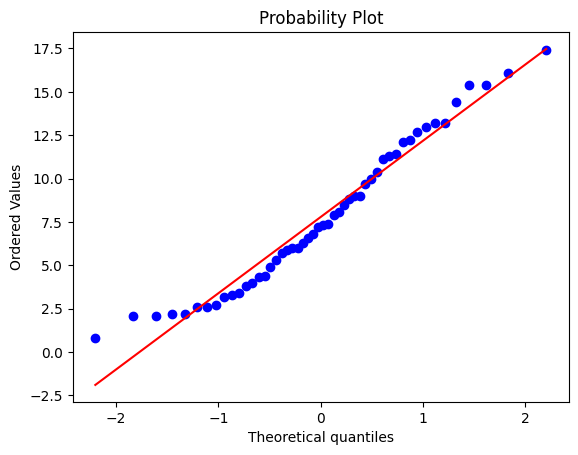

In [80]:
#Normal quantile quantile plot - helps in understending the distribution of data - normally distributed or not
import scipy.stats as stats
import pylab

stats.probplot(df_num.Murder, dist='norm', plot=pylab)

((array([-2.20385432, -1.83293478, -1.61402323, -1.45296849, -1.32267759,
         -1.21163342, -1.113805  , -1.02561527, -0.94475674, -0.86964726,
         -0.79915021, -0.73241807, -0.66879925, -0.6077796 , -0.54894415,
         -0.49195112, -0.43651377, -0.38238727, -0.32935914, -0.27724191,
         -0.2258675 , -0.17508277, -0.12474591, -0.07472335, -0.02488719,
          0.02488719,  0.07472335,  0.12474591,  0.17508277,  0.2258675 ,
          0.27724191,  0.32935914,  0.38238727,  0.43651377,  0.49195112,
          0.54894415,  0.6077796 ,  0.66879925,  0.73241807,  0.79915021,
          0.86964726,  0.94475674,  1.02561527,  1.113805  ,  1.21163342,
          1.32267759,  1.45296849,  1.61402323,  1.83293478,  2.20385432]),
  array([ 45,  46,  48,  53,  56,  57,  72,  81,  83,  86, 102, 106, 109,
         109, 110, 113, 115, 120, 120, 120, 145, 149, 151, 156, 159, 159,
         161, 174, 178, 188, 190, 201, 204, 211, 236, 238, 249, 249, 252,
         254, 255, 259, 263, 276, 27

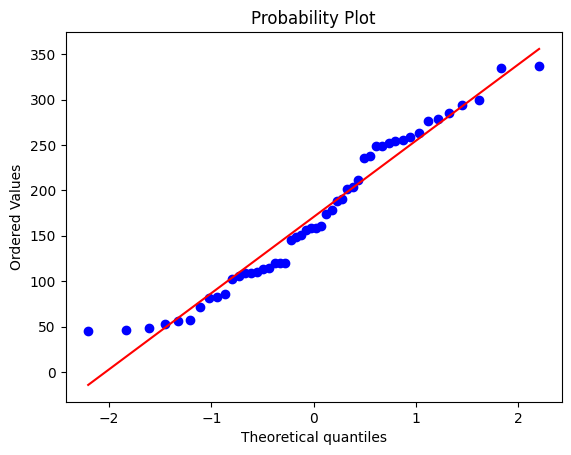

In [81]:
stats.probplot(df_num.Assault, dist='norm', plot=pylab)

((array([-2.20385432, -1.83293478, -1.61402323, -1.45296849, -1.32267759,
         -1.21163342, -1.113805  , -1.02561527, -0.94475674, -0.86964726,
         -0.79915021, -0.73241807, -0.66879925, -0.6077796 , -0.54894415,
         -0.49195112, -0.43651377, -0.38238727, -0.32935914, -0.27724191,
         -0.2258675 , -0.17508277, -0.12474591, -0.07472335, -0.02488719,
          0.02488719,  0.07472335,  0.12474591,  0.17508277,  0.2258675 ,
          0.27724191,  0.32935914,  0.38238727,  0.43651377,  0.49195112,
          0.54894415,  0.6077796 ,  0.66879925,  0.73241807,  0.79915021,
          0.86964726,  0.94475674,  1.02561527,  1.113805  ,  1.21163342,
          1.32267759,  1.45296849,  1.61402323,  1.83293478,  2.20385432]),
  array([32, 39, 44, 44, 45, 45, 48, 48, 50, 51, 52, 53, 54, 56, 57, 58, 59,
         60, 60, 62, 63, 65, 66, 66, 66, 66, 67, 67, 68, 70, 70, 72, 72, 73,
         74, 75, 77, 78, 80, 80, 80, 80, 81, 83, 83, 85, 86, 87, 89, 91],
        dtype=int64)),
 (14.73

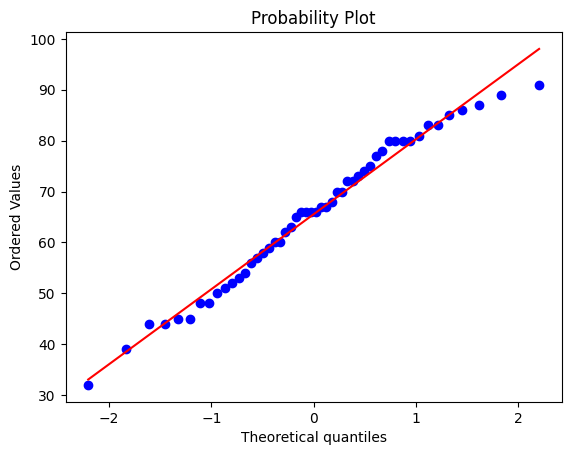

In [82]:
stats.probplot(df_num.UrbanPop, dist='norm', plot=pylab)

((array([-2.20385432, -1.83293478, -1.61402323, -1.45296849, -1.32267759,
         -1.21163342, -1.113805  , -1.02561527, -0.94475674, -0.86964726,
         -0.79915021, -0.73241807, -0.66879925, -0.6077796 , -0.54894415,
         -0.49195112, -0.43651377, -0.38238727, -0.32935914, -0.27724191,
         -0.2258675 , -0.17508277, -0.12474591, -0.07472335, -0.02488719,
          0.02488719,  0.07472335,  0.12474591,  0.17508277,  0.2258675 ,
          0.27724191,  0.32935914,  0.38238727,  0.43651377,  0.49195112,
          0.54894415,  0.6077796 ,  0.66879925,  0.73241807,  0.79915021,
          0.86964726,  0.94475674,  1.02561527,  1.113805  ,  1.21163342,
          1.32267759,  1.45296849,  1.61402323,  1.83293478,  2.20385432]),
  array([ 7.3  ,  7.8  ,  8.3  ,  9.3  ,  9.5  , 10.8  , 11.1  , 11.2  ,
         11.3  , 12.8  , 14.2  , 14.9  , 14.9  , 15.6  , 15.8  , 16.1  ,
         16.3  , 16.3  , 16.4  , 16.5  , 17.1  , 18.   , 18.8  , 19.5  ,
         20.   , 20.2  , 20.7  , 21.   

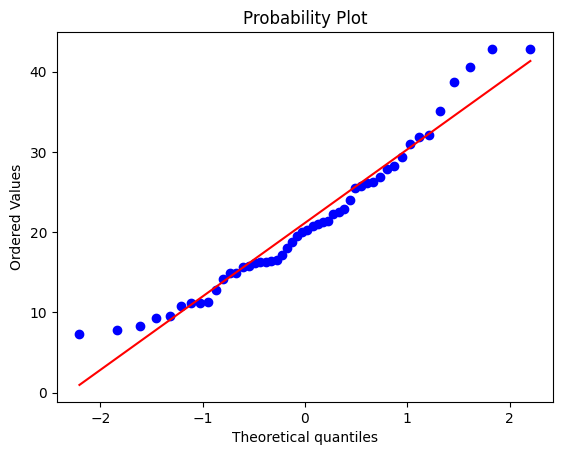

In [83]:
stats.probplot(df_num.Rape, dist='norm', plot=pylab)

In [84]:
#concatenate entire data
df1 = pd.concat([df_cat, df_num], axis = 1)  # Prezprocessed data for clustering
df1.head()

,State,Murder,Assault,UrbanPop,Rape
0,Alabama,13.2,236,58,21.200
1,Alaska,10.0,263,48,42.825
2,Arizona,8.1,294,80,31.000
3,Arkansas,8.8,190,50,19.500
4,California,9.0,276,91,40.600


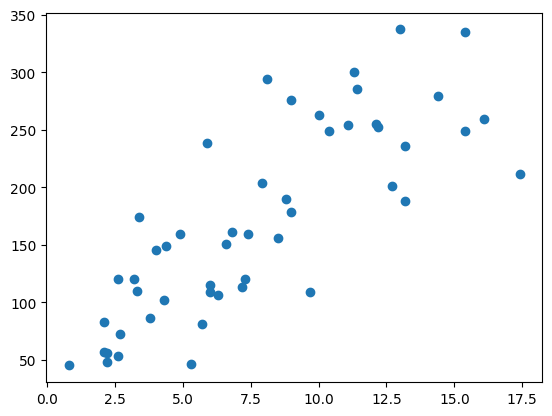

In [96]:
#Bivariate Analysis
#scatter plot
plt.scatter(df1['Murder'], y=df1['Assault'])

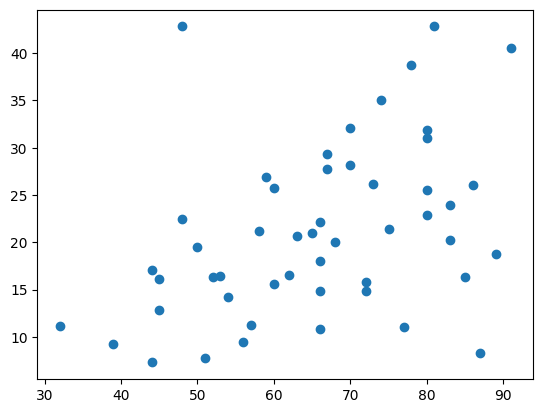

In [97]:
plt.scatter(x = df1['UrbanPop'], y=df1['Rape'])

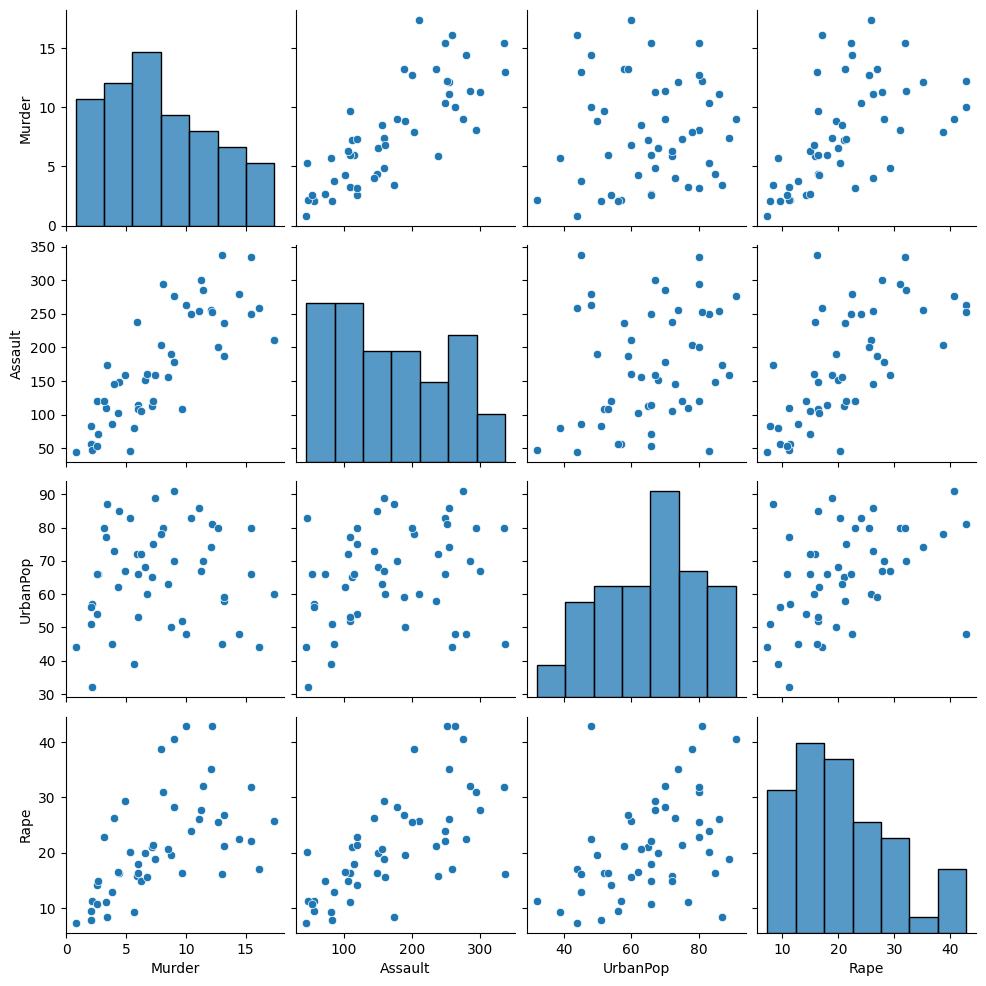

In [98]:
sns.pairplot(df_num) # Use numerical variables for scatter plots

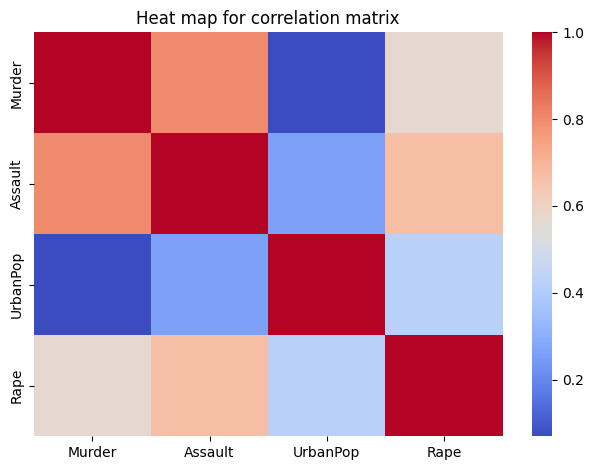

In [99]:
#heat map

corr_matrix = df_num.corr(method='pearson')
sns.heatmap(corr_matrix, xticklabels=corr_matrix.columns, yticklabels=corr_matrix.columns, cmap = 'coolwarm')
plt.title('Heat map for correlation matrix')
plt.tight_layout()
plt.show()

In [100]:
#scaling using normalization
def norm_func(i):
    x = (i - i.min()) / (i.max() - i.min())
    return x

In [101]:
df_norm = norm_func(df1.iloc[:, 1:])

In [102]:
df_norm.describe()

,Murder,Assault,UrbanPop,Rape
count,50.000000,50.000000,50.000000,50.000000
mean,0.420964,0.430685,0.568475,0.389444
std,0.262380,0.285403,0.245335,0.256732
min,0.000000,0.000000,0.000000,0.000000
25%,0.197289,0.219178,0.381356,0.218860
50%,0.388554,0.390411,0.576271,0.360310
75%,0.629518,0.698630,0.775424,0.531316
max,1.000000,1.000000,1.000000,1.000000


In [103]:
#clustering and model building
#Hierarchical clustering - agglomerative clustering

In [104]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage,dendrogram

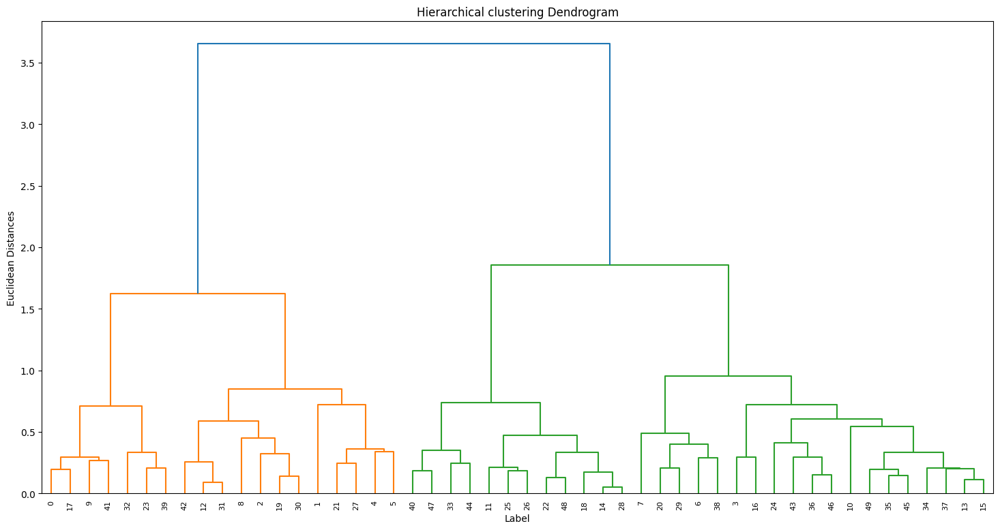

In [106]:
plt.figure(1,figsize=(18,9))
tree_plot = dendrogram(linkage(df_norm,method='ward'))

plt.title('Hierarchical clustering Dendrogram')
plt.xlabel('Label')
plt.ylabel('Euclidean Distances')
plt.show()

In [107]:
# Applying AgglomerativeClustering choosing 3 as clusters from the above dendrogram
hc1 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete')

y_hc1=hc1.fit_predict(df_norm)
y_hc1

array([2, 1, 1, 0, 1, 1, 0, 0, 1, 2, 0, 0, 1, 0, 0, 0, 0, 2, 0, 1, 0, 1,
       0, 2, 0, 0, 0, 1, 0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 1, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [108]:
hc2 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='average')

y_hc2=hc2.fit_predict(df_norm)
y_hc2

array([0, 2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 1], dtype=int64)

In [109]:
hc3 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='single')
y_hc3 = hc3.fit_predict(df_norm)
y_hc3

array([0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [110]:
hc4 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
y_hc4 = hc4.fit_predict(df_norm)
y_hc4

array([0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 2, 0, 1, 2, 1, 1, 0, 2, 0, 1, 0,
       2, 0, 1, 2, 2, 0, 2, 1, 0, 0, 0, 2, 1, 1, 1, 1, 1, 0, 2, 0, 0, 1,
       2, 1, 1, 2, 2, 1], dtype=int64)

In [111]:
hc1.labels_  # Refering to the results obtained from linkage = 'complete' method

array([2, 1, 1, 0, 1, 1, 0, 0, 1, 2, 0, 0, 1, 0, 0, 0, 0, 2, 0, 1, 0, 1,
       0, 2, 0, 0, 0, 1, 0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 1, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [112]:
cluster_labels = pd.Series(hc1.labels_)

In [114]:
df['cluster']= cluster_labels
df.head()    # Add Cluster labels to orignal Dataset

,State,Murder,Assault,UrbanPop,Rape,cluster
0,Alabama,13.2,236,58,21.2,2
1,Alaska,10.0,263,48,44.5,1
2,Arizona,8.1,294,80,31.0,1
3,Arkansas,8.8,190,50,19.5,0
4,California,9.0,276,91,40.6,1


In [115]:
#cluster evaluation
df2 = df.sort_values(by='cluster')
df2

,State,Murder,Assault,UrbanPop,Rape,cluster
24,Missouri,9.0,178,70,28.2,0
48,Wisconsin,2.6,53,66,10.8,0
25,Montana,6.0,109,53,16.4,0
26,Nebraska,4.3,102,62,16.5,0
28,New Hampshire,2.1,57,56,9.5,0
29,New Jersey,7.4,159,89,18.8,0
33,North Dakota,0.8,45,44,7.3,0
34,Ohio,7.3,120,75,21.4,0
35,Oklahoma,6.6,151,68,20.0,0
36,Oregon,4.9,159,67,29.3,0


In [116]:
# Aggregate by doing mean of each cluster
df2.iloc[:, 1:6].groupby(df2.cluster).mean()

,Murder,Assault,UrbanPop,Rape,cluster
cluster,,,,,
0,5.003226,116.483871,63.838710,16.338710,0.0
1,10.966667,264.000000,76.500000,33.608333,1.0
2,14.671429,251.285714,54.285714,21.685714,2.0


In [117]:
cluster0 = df2.loc[(df2.cluster ==0), :]
cluster0

,State,Murder,Assault,UrbanPop,Rape,cluster
24,Missouri,9.0,178,70,28.2,0
48,Wisconsin,2.6,53,66,10.8,0
25,Montana,6.0,109,53,16.4,0
26,Nebraska,4.3,102,62,16.5,0
28,New Hampshire,2.1,57,56,9.5,0
29,New Jersey,7.4,159,89,18.8,0
33,North Dakota,0.8,45,44,7.3,0
34,Ohio,7.3,120,75,21.4,0
35,Oklahoma,6.6,151,68,20.0,0
36,Oregon,4.9,159,67,29.3,0


In [118]:
cluster1 = df2.loc[(df2.cluster == 1), :]
cluster1

,State,Murder,Assault,UrbanPop,Rape,cluster
1,Alaska,10.0,263,48,44.5,1
2,Arizona,8.1,294,80,31.0,1
4,California,9.0,276,91,40.6,1
5,Colorado,7.9,204,78,38.7,1
42,Texas,12.7,201,80,25.5,1
8,Florida,15.4,335,80,31.9,1
21,Michigan,12.1,255,74,35.1,1
19,Maryland,11.3,300,67,27.8,1
12,Illinois,10.4,249,83,24.0,1
31,New York,11.1,254,86,26.1,1


In [119]:
cluster2 = df2.loc[(df2.cluster == 2), :]
cluster2

,State,Murder,Assault,UrbanPop,Rape,cluster
39,South Carolina,14.4,279,48,22.5,2
41,Tennessee,13.2,188,59,26.9,2
32,North Carolina,13.0,337,45,16.1,2
17,Louisiana,15.4,249,66,22.2,2
23,Mississippi,16.1,259,44,17.1,2
9,Georgia,17.4,211,60,25.8,2
0,Alabama,13.2,236,58,21.2,2


# Problem - 3

### 3.	Perform clustering analysis on the telecom dataset. The data is a mixture of both categorical and numerical data. It consists of the number of customers who churn. Derive insights and get possible information on factors that may affect the churn decision. Refer to Telco_customer_churn.xlsx dataset.

In [1]:
import os
os.chdir(r'D:\360 Data Science 360DigiTMG\Day12-Dataset_Assignment Clustering')

In [1]:
#importing required libraries
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster.hierarchy import linkage,dendrogram
import scipy.cluster.hierarchy as sch

In [137]:
#read the data into python
df = pd.read_excel("Telco_customer_churn.xlsx")
pd.set_option('display.max_columns',None)
df

,Customer ID,Count,Quarter,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
0,8779-QRDMV,1,Q3,No,0,1,None,No,0.00,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.65,39.65,0.00,20,0.00,59.65
1,7495-OOKFY,1,Q3,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.65,633.30,0.00,0,390.80,1024.10
2,1658-BYGOY,1,Q3,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.45,1752.55,45.61,0,203.94,1910.88
3,4598-XLKNJ,1,Q3,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,12,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.50,2514.50,13.43,0,494.00,2995.07
4,4846-WHAFZ,1,Q3,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Fiber Optic,14,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,76.50,2868.15,0.00,0,234.21,3102.36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,2569-WGERO,1,Q3,No,0,72,None,Yes,22.77,No,No,None,0,No,No,No,No,No,No,No,No,Two Year,Yes,Bank Withdrawal,21.15,1419.40,19.31,0,1639.44,3039.53
7039,6840-RESVB,1,Q3,Yes,1,24,Offer C,Yes,36.05,Yes,Yes,Cable,24,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,One Year,Yes,Mailed Check,84.80,1990.50,48.23,0,865.20,2807.47
7040,2234-XADUH,1,Q3,Yes,4,72,None,Yes,29.66,Yes,Yes,Fiber Optic,59,No,Yes,Yes,No,Yes,Yes,Yes,Yes,One Year,Yes,Credit Card,103.20,7362.90,45.38,0,2135.52,9453.04
7041,4801-JZAZL,1,Q3,Yes,1,11,None,No,0.00,No,Yes,DSL,17,Yes,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,29.60,346.45,27.24,0,0.00,319.21


In [138]:
#to see all the column names
df.columns

Index(['Customer ID', 'Count', 'Quarter', 'Referred a Friend',
       'Number of Referrals', 'Tenure in Months', 'Offer', 'Phone Service',
       'Avg Monthly Long Distance Charges', 'Multiple Lines',
       'Internet Service', 'Internet Type', 'Avg Monthly GB Download',
       'Online Security', 'Online Backup', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV', 'Streaming Movies',
       'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing',
       'Payment Method', 'Monthly Charge', 'Total Charges', 'Total Refunds',
       'Total Extra Data Charges', 'Total Long Distance Charges',
       'Total Revenue'],
      dtype='object')

In [139]:
#checking the size of the data
df.shape

(7043, 30)

In [140]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 30 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Count                              7043 non-null   int64  
 2   Quarter                            7043 non-null   object 
 3   Referred a Friend                  7043 non-null   object 
 4   Number of Referrals                7043 non-null   int64  
 5   Tenure in Months                   7043 non-null   int64  
 6   Offer                              7043 non-null   object 
 7   Phone Service                      7043 non-null   object 
 8   Avg Monthly Long Distance Charges  7043 non-null   float64
 9   Multiple Lines                     7043 non-null   object 
 10  Internet Service                   7043 non-null   object 
 11  Internet Type                      7043 non-null   objec

In [141]:
###################data cleaning###############
#check any null value is present
df.isnull().sum()

Customer ID                          0
Count                                0
Quarter                              0
Referred a Friend                    0
Number of Referrals                  0
Tenure in Months                     0
Offer                                0
Phone Service                        0
Avg Monthly Long Distance Charges    0
Multiple Lines                       0
Internet Service                     0
Internet Type                        0
Avg Monthly GB Download              0
Online Security                      0
Online Backup                        0
Device Protection Plan               0
Premium Tech Support                 0
Streaming TV                         0
Streaming Movies                     0
Streaming Music                      0
Unlimited Data                       0
Contract                             0
Paperless Billing                    0
Payment Method                       0
Monthly Charge                       0
Total Charges            

In [142]:
#checking for outliers
df.describe()

,Count,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
count,7043.0,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,1.0,1.951867,32.386767,22.958954,20.515405,64.761692,2280.381264,1.962182,6.860713,749.099262,3034.379056
std,0.0,3.001199,24.542061,15.448113,20.418940,30.090047,2266.220462,7.902614,25.104978,846.660055,2865.204542
min,1.0,0.000000,1.000000,0.000000,0.000000,18.250000,18.800000,0.000000,0.000000,0.000000,21.360000
25%,1.0,0.000000,9.000000,9.210000,3.000000,35.500000,400.150000,0.000000,0.000000,70.545000,605.610000
50%,1.0,0.000000,29.000000,22.890000,17.000000,70.350000,1394.550000,0.000000,0.000000,401.440000,2108.640000
75%,1.0,3.000000,55.000000,36.395000,27.000000,89.850000,3786.600000,0.000000,0.000000,1191.100000,4801.145000
max,1.0,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


In [143]:
df.nunique()

Customer ID                          7043
Count                                   1
Quarter                                 1
Referred a Friend                       2
Number of Referrals                    12
Tenure in Months                       72
Offer                                   6
Phone Service                           2
Avg Monthly Long Distance Charges    3584
Multiple Lines                          2
Internet Service                        2
Internet Type                           4
Avg Monthly GB Download                50
Online Security                         2
Online Backup                           2
Device Protection Plan                  2
Premium Tech Support                    2
Streaming TV                            2
Streaming Movies                        2
Streaming Music                         2
Unlimited Data                          2
Contract                                3
Paperless Billing                       2
Payment Method                    

In [144]:
#checking for duplicate values
duplicate = df.duplicated()
sum(duplicate)                  #hence there is no duplicates we can go ot next step

0

In [145]:
#drop count,quarter coloumns
df.drop(['Count','Quarter'],axis = 1,inplace = True)
df.dtypes

Customer ID                           object
Referred a Friend                     object
Number of Referrals                    int64
Tenure in Months                       int64
Offer                                 object
Phone Service                         object
Avg Monthly Long Distance Charges    float64
Multiple Lines                        object
Internet Service                      object
Internet Type                         object
Avg Monthly GB Download                int64
Online Security                       object
Online Backup                         object
Device Protection Plan                object
Premium Tech Support                  object
Streaming TV                          object
Streaming Movies                      object
Streaming Music                       object
Unlimited Data                        object
Contract                              object
Paperless Billing                     object
Payment Method                        object
Monthly Ch

In [146]:
#creat dummy variables on categorical data
df_new = pd.get_dummies(df)

In [147]:
df_new

,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer ID_0002-ORFBO,Customer ID_0003-MKNFE,Customer ID_0004-TLHLJ,Customer ID_0011-IGKFF,Customer ID_0013-EXCHZ,Customer ID_0013-MHZWF,Customer ID_0013-SMEOE,Customer ID_0014-BMAQU,Customer ID_0015-UOCOJ,Customer ID_0016-QLJIS,Customer ID_0017-DINOC,Customer ID_0017-IUDMW,Customer ID_0018-NYROU,Customer ID_0019-EFAEP,Customer ID_0019-GFNTW,Customer ID_0020-INWCK,Customer ID_0020-JDNXP,Customer ID_0021-IKXGC,Customer ID_0022-TCJCI,Customer ID_0023-HGHWL,Customer ID_0023-UYUPN,Customer ID_0023-XUOPT,Customer ID_0027-KWYKW,Customer ID_0030-FNXPP,Customer ID_0031-PVLZI,Customer ID_0032-PGELS,Customer ID_0036-IHMOT,Customer ID_0040-HALCW,Customer ID_0042-JVWOJ,Customer ID_0042-RLHYP,Customer ID_0048-LUMLS,Customer ID_0048-PIHNL,Customer ID_0052-DCKON,Customer ID_0052-YNYOT,Customer ID_0056-EPFBG,Customer ID_0057-QBUQH,Customer ID_0058-EVZWM,Customer ID_0060-FUALY,Customer ID_0064-SUDOG,Customer ID_0064-YIJGF,Customer ID_0067-DKWBL,Customer ID_0068-FIGTF,Customer ID_0071-NDAFP,Customer ID_0074-HDKDG,Customer ID_0076-LVEPS,Customer ID_0078-XZMHT,Customer ID_0080-EMYVY,Customer ID_0080-OROZO,Customer ID_0082-LDZUE,Customer ID_0082-OQIQY,Customer ID_0083-PIVIK,Customer ID_0089-IIQKO,Customer ID_0093-EXYQL,Customer ID_0093-XWZFY,Customer ID_0094-OIFMO,Customer ID_0096-BXERS,Customer ID_0096-FCPUF,Customer ID_0098-BOWSO,Customer ID_0100-DUVFC,Customer ID_0103-CSITQ,Customer ID_0104-PPXDV,Customer ID_0106-GHRQR,Customer ID_0106-UGRDO,Customer ID_0107-WESLM,Customer ID_0107-YHINA,Customer ID_0111-KLBQG,Customer ID_0112-QAWRZ,Customer ID_0112-QWPNC,Customer ID_0114-IGABW,Customer ID_0114-PEGZZ,Customer ID_0114-RSRRW,Customer ID_0115-TFERT,Customer ID_0117-LFRMW,Customer ID_0118-JPNOY,Customer ID_0121-SNYRK,Customer ID_0122-OAHPZ,Customer ID_0123-CRBRT,Customer ID_0125-LZQXK,Customer ID_0128-MKWSG,Customer ID_0129-KPTWJ,Customer ID_0129-QMPDR,Customer ID_0130-SXOUN,Customer ID_0133-BMFZO,Customer ID_0134-XWXCE,Customer ID_0135-NMXAP,Customer ID_0136-IFMYD,Customer ID_0137-OCGAB,Customer ID_0137-UDEUO,Customer ID_0139-IVFJG,Customer ID_0141-YEAYS,Customer ID_0142-GVYSN,Customer ID_0147-ESWWR,Customer ID_0148-DCDOS,Customer ID_0151-ONTOV,Customer ID_0156-FVPTA,Customer ID_0164-APGRB,Customer ID_0164-XAIRP,Customer ID_0168-XZKBB,Customer ID_0174-QRVVY,Customer ID_0177-PXBAT,Customer ID_0178-CIIKR,Customer ID_0178-SZBHO,Customer ID_0181-RITDD,Customer ID_0186-CAERR,Customer ID_0187-QSXOE,Customer ID_0187-WZNAB,Customer ID_0188-GWFLE,Customer ID_0191-EQUUH,Customer ID_0191-ZHSKZ,Customer ID_0193-ESZXP,Customer ID_0195-IESCP,Customer ID_0196-JTUQI,Customer ID_0196-VULGZ,Customer ID_0197-PNKNK,Customer ID_0201-MIBOL,Customer ID_0201-OAMXR,Customer ID_0203-HHYIJ,Customer ID_0206-OYVOC,Customer ID_0206-TBWLC,Customer ID_0207-MDKNV,Customer ID_0208-BPQEJ,Customer ID_0212-ISBBF,Customer ID_0214-JHPFW,Customer ID_0215-BQKGS,Customer ID_0218-QNVAS,Customer ID_0219-QAERP,Customer ID_0219-YTZUE,Customer ID_0220-EBGCE,Customer ID_0221-NAUXK,Customer ID_0221-WMXNQ,Customer ID_0222-CNVPT,Customer ID_0224-HJAPT,Customer ID_0224-NIJLP,Customer ID_0224-RLWWD,Customer ID_0225-ZORZP,Customer ID_0228-MAUWC,Customer ID_0229-LFJAF,Customer ID_0230-UBYPQ,Customer ID_0230-WEQUW,Customer ID_0231-LXVAP,Customer ID_0233-FTHAV,Customer ID_0234-TEVTT,Customer ID_0235-KGSLC,Customer ID_0236-HFWSV,Customer ID_0237-YFUTL,Customer ID_0238-WHBIQ,Customer ID_0239-OXEXL,Customer ID_0244-LGNFY,Customer ID_0247-SLUJI,Customer ID_0248-IPDFW,Customer ID_0248-PGHBZ,Customer ID_0253-ZTEOB,Customer ID_0254-FNMCI,Customer ID_0254-KCJGT,Customer ID_0254-WWRKD,Customer ID_0256-LTHVJ,Customer ID_0257-KXZGU,Customer ID_0257-ZESQC,Customer ID_0258-NOKBL,Customer ID_0259-GBZSH,Customer ID_0260-ZDLGK,Customer ID_0263-FJTQO,Customer ID_0264-CNITK,Customer ID_0265-EDXBD,Customer ID_0265-PSUAE

In [148]:
from sklearn.preprocessing import OneHotEncoder
one_hot = OneHotEncoder()
one_hot_df = pd.DataFrame(one_hot.fit_transform(df).toarray())

In [149]:
#creating instance of label encoder

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
x = df.iloc[: , :]

In [150]:
x['Customer ID'] = label_encoder.fit_transform(x['Customer ID'])
x['Referred a Friend'] = label_encoder.fit_transform(x['Referred a Friend'])
x['Number of Referrals'] = label_encoder.fit_transform(x['Number of Referrals'])
x['Tenure in Months'] = label_encoder.fit_transform(x['Tenure in Months'])
x['Offer'] = label_encoder.fit_transform(x['Offer'])
x['Phone Service'] = label_encoder.fit_transform(x['Phone Service'])
x['Avg Monthly Long Distance Charges'] = label_encoder.fit_transform(x['Avg Monthly Long Distance Charges'])
x['Multiple Lines'] = label_encoder.fit_transform(x['Multiple Lines'])
x['Internet Service'] = label_encoder.fit_transform(x['Internet Service'])
x['Internet Type'] = label_encoder.fit_transform(x['Internet Type'])
x['Avg Monthly GB Download'] = label_encoder.fit_transform(x['Avg Monthly GB Download'])
x['Online Security'] = label_encoder.fit_transform(x['Online Security'])
x['Online Backup'] = label_encoder.fit_transform(x['Online Backup'])
x['Device Protection Plan'] = label_encoder.fit_transform(x['Device Protection Plan'])
x['Premium Tech Support'] = label_encoder.fit_transform(x['Premium Tech Support'])
x['Streaming TV'] = label_encoder.fit_transform(x['Streaming TV'])
x['Streaming Movies'] = label_encoder.fit_transform(x['Streaming Movies'])
x['Streaming Music'] = label_encoder.fit_transform(x['Streaming Music'])
x['Unlimited Data'] = label_encoder.fit_transform(x['Unlimited Data'])
x['Contract'] = label_encoder.fit_transform(x['Contract'])
x['Paperless Billing'] = label_encoder.fit_transform(x['Paperless Billing'])
x['Payment Method'] = label_encoder.fit_transform(x['Payment Method'])
x['Monthly Charge'] = label_encoder.fit_transform(x['Monthly Charge'])
x['Total Charges'] = label_encoder.fit_transform(x['Total Charges'])
x['Total Refunds'] = label_encoder.fit_transform(x['Total Refunds'])
x['Total Refunds'] = label_encoder.fit_transform(x['Total Refunds'])
x['Total Long Distance Charges'] = label_encoder.fit_transform(x['Total Long Distance Charges'])
x['Total Revenue'] = label_encoder.fit_transform(x['Total Revenue'])

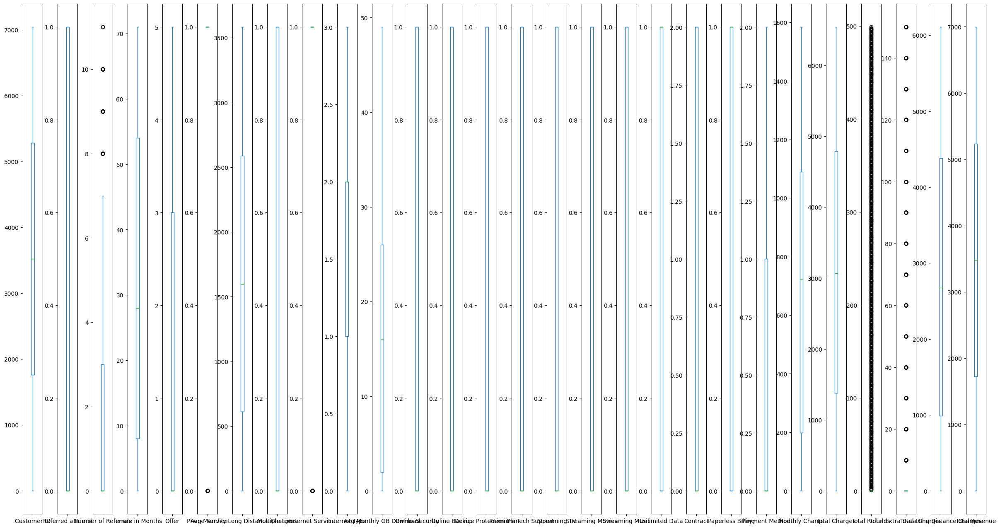

In [151]:
#univariate analysis
#boxplot
df.plot(kind = 'box',subplots = True, sharey = False, figsize=(30,16))
plt.subplots_adjust(wspace=0.75)
plt.show()

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


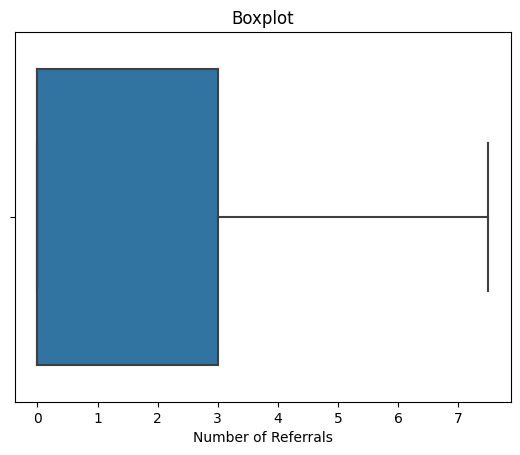

In [152]:
#detection of outliers(find the RM based on IQR)
IQR = df["Number of Referrals"].quantile(0.75) - df["Number of Referrals"].quantile(0.25)
lower_limit = df["Number of Referrals"].quantile(0.25) - (IQR * 1.5)
upper_limit = df["Number of Referrals"].quantile(0.75) + (IQR * 1.5)

#replace the outliers by the maximum and minimum limit
df["Number of Referrals"] = pd.DataFrame(np.where(df["Number of Referrals"] >upper_limit, upper_limit,
                                         np.where(df["Number of Referrals"] < lower_limit,lower_limit,
                                                  df["Number of Referrals"])))

sns.boxplot(df["Number of Referrals"]);plt.title("Boxplot");plt.show()

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


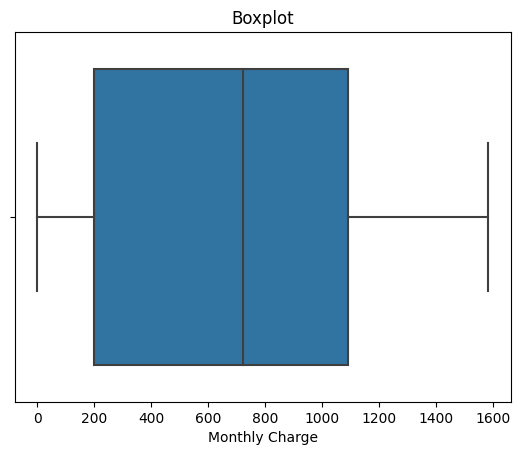

In [153]:
#detection of outliers(find the RM based on IQR)
IQR = df["Monthly Charge"].quantile(0.75) - df["Monthly Charge"].quantile(0.25)
lower_limit = df["Monthly Charge"].quantile(0.25) - (IQR * 1.5)
upper_limit = df["Monthly Charge"].quantile(0.75) + (IQR * 1.5)

#replace the outliers by the maximum and minimum limit
df["Monthly Charge"] = pd.DataFrame(np.where(df["Monthly Charge"] >upper_limit, upper_limit,
                                         np.where(df["Monthly Charge"] < lower_limit,lower_limit,
                                                  df["Monthly Charge"])))

sns.boxplot(df["Monthly Charge"]);plt.title("Boxplot");plt.show()

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


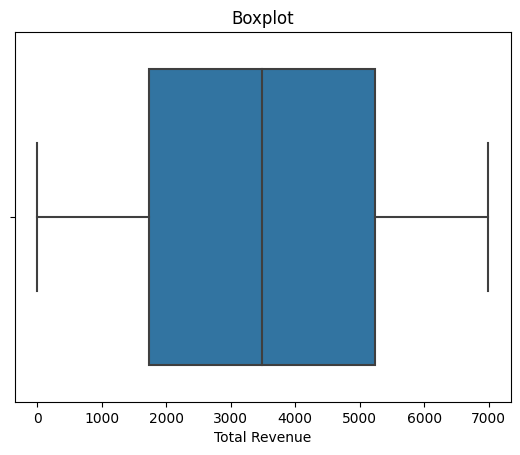

In [154]:
#detection of outliers(find the RM based on IQR)
IQR = df["Total Revenue"].quantile(0.75) - df["Total Revenue"].quantile(0.25)
lower_limit = df["Total Revenue"].quantile(0.25) - (IQR * 1.5)
upper_limit = df["Total Revenue"].quantile(0.75) + (IQR * 1.5)

#replace the outliers by the maximum and minimum limit
df["Total Revenue"] = pd.DataFrame(np.where(df["Total Revenue"] >upper_limit, upper_limit,
                                         np.where(df["Total Revenue"] < lower_limit,lower_limit,
                                                  df["Total Revenue"])))

sns.boxplot(df["Total Revenue"]);plt.title("Boxplot");plt.show()

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='Number of Referrals', ylabel='Monthly Charge'>

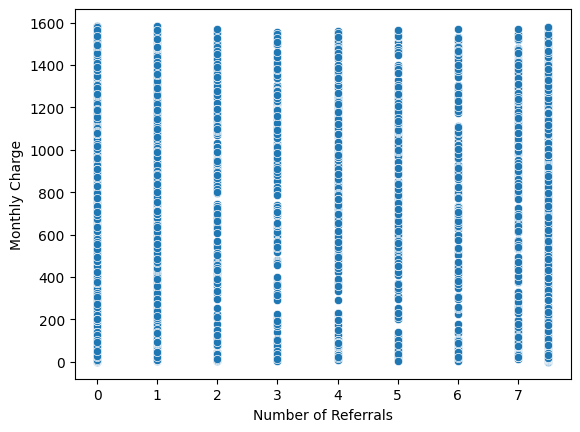

In [155]:
#bivariate analysis
#scatterplot
sns.scatterplot(df["Number of Referrals"],df["Monthly Charge"])

C:\Users\J. Berger Perkins\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot: xlabel='Number of Referrals', ylabel='Total Revenue'>

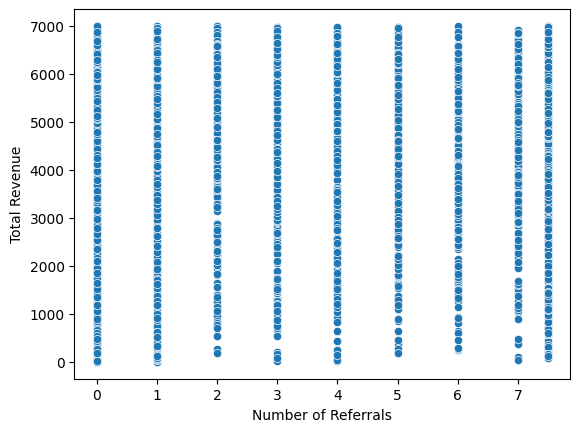

In [156]:
sns.scatterplot(df["Number of Referrals"],df["Total Revenue"])

In [157]:
#normalisation function
def norm_func(i):
    x = (i-i.min())/(i.max()-i.min())
    return(x)

In [158]:
df_norm = norm_func(df_new)

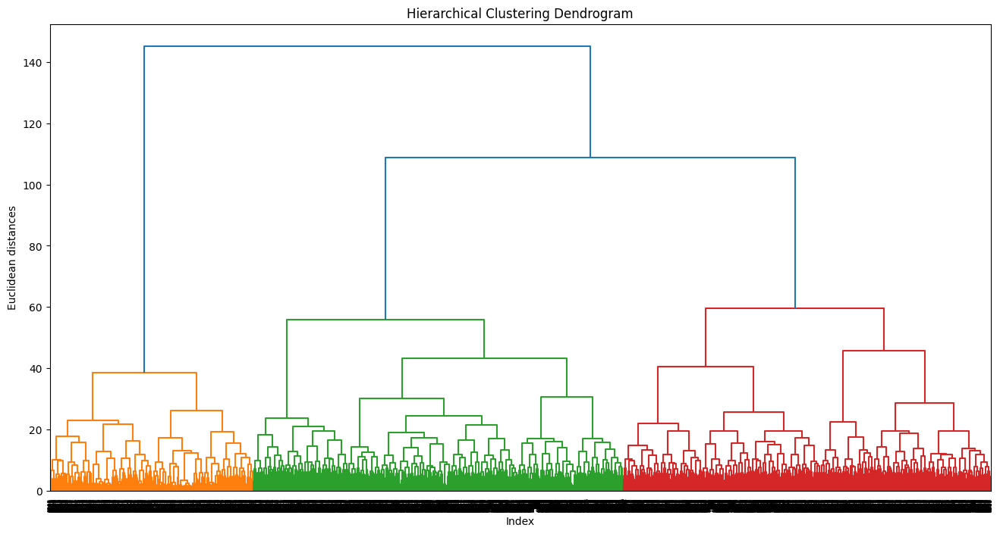

In [161]:
plt.figure(1, figsize = (16, 8))
tree_plot = dendrogram(linkage(df_norm, method  = "ward"))

plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Index')
plt.ylabel('Euclidean distances')
plt.show()

In [162]:
# Applying AgglomerativeClustering choosing 3 as clusters from the above dendrogram
hc1 = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'complete')

y_hc1 = hc1.fit_predict(df_norm)
y_hc1

array([1, 2, 0, ..., 0, 1, 0], dtype=int64)

In [163]:
hc2 = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'average')

y_hc2 = hc2.fit_predict(df_norm)
y_hc2

array([1, 0, 1, ..., 1, 0, 1], dtype=int64)

In [164]:
hc3 = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'single')

y_hc3 = hc3.fit_predict(df_norm)
y_hc3

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [165]:
hc1.labels_   # Refering to the results obtained from linkage = 'complete' method

array([1, 2, 0, ..., 0, 1, 0], dtype=int64)

In [166]:
cluster_labels = pd.Series(hc1.labels_)

In [167]:
# Add Cluster labels to orignal Dataset

df['cluster'] = cluster_labels
df.head()

,Customer ID,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,cluster
0,6207,0,0.0,0,0,0,0,0,1,1,7,0,0,1,0,0,1,0,0,0,1,0,237.0,112,0,20,0,218.0,1
1,5305,1,1.0,7,5,1,3499,1,1,2,16,0,1,0,0,0,0,0,1,0,1,1,913.0,1859,0,0,2637,2346.0,2
2,1129,0,0.0,17,4,1,768,1,1,2,37,0,0,0,0,1,1,1,1,0,1,0,1197.0,3485,449,0,1873,3293.0,0
3,3208,1,1.0,24,3,1,1383,0,1,2,11,0,1,1,0,1,1,0,1,0,1,0,1252.0,4076,110,0,2958,4196.0,2
4,3419,1,1.0,36,3,1,405,1,1,2,13,0,0,0,0,0,0,0,1,0,1,0,837.0,4282,0,0,2030,4293.0,2


In [168]:
df = df.iloc[:,[28,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27]]
df.head()

,cluster,Customer ID,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
0,1,6207,0,0.0,0,0,0,0,0,1,1,7,0,0,1,0,0,1,0,0,0,1,0,237.0,112,0,20,0,218.0
1,2,5305,1,1.0,7,5,1,3499,1,1,2,16,0,1,0,0,0,0,0,1,0,1,1,913.0,1859,0,0,2637,2346.0
2,0,1129,0,0.0,17,4,1,768,1,1,2,37,0,0,0,0,1,1,1,1,0,1,0,1197.0,3485,449,0,1873,3293.0
3,2,3208,1,1.0,24,3,1,1383,0,1,2,11,0,1,1,0,1,1,0,1,0,1,0,1252.0,4076,110,0,2958,4196.0
4,2,3419,1,1.0,36,3,1,405,1,1,2,13,0,0,0,0,0,0,0,1,0,1,0,837.0,4282,0,0,2030,4293.0


In [169]:
df2 = df.sort_values(by = 'cluster')
df2

,cluster,Customer ID,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
7042,0,2226,0,0.0,65,0,1,2179,0,1,2,10,1,0,1,1,1,1,1,1,2,1,0,1388.0,6160,0,0,5360,6675.0
5918,0,1712,0,0.0,32,0,1,1161,1,1,2,49,1,0,0,0,0,1,1,1,0,1,0,1106.0,4352,0,0,3117,4564.0
5917,0,6010,0,0.0,30,0,1,2765,1,1,2,42,0,0,0,0,0,0,0,1,0,1,0,828.0,3884,0,0,4402,4491.0
5916,0,3069,1,7.5,69,0,1,2790,1,1,2,46,1,1,1,1,1,1,1,1,2,0,1,1541.0,6420,0,0,5848,6936.0
5915,0,2332,0,0.0,11,4,1,951,1,1,2,7,0,0,0,0,1,1,1,1,0,0,0,1179.0,2734,0,0,1670,2703.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3619,2,3461,1,3.0,53,0,1,3467,1,1,1,27,0,1,0,1,1,0,0,1,1,1,0,729.0,4778,0,0,5789,5830.0
6351,2,2702,1,7.5,15,0,1,3297,0,1,2,29,1,1,0,0,0,0,0,1,0,0,0,915.0,2958,0,0,3552,3437.0
2232,2,6740,1,7.0,58,0,1,3533,1,1,2,20,1,1,1,1,1,0,0,0,0,1,0,1410.0,5944,0,40,5932,6737.0
679,2,2038,0,0.0,58,0,1,1343,1,1,2,12,1,1,1,1,0,0,0,0,1,1,0,1169.0,5607,0,30,4274,5923.0


In [170]:
# Aggregate by doing mean of each cluster
df2.iloc[:, 2:9].groupby(df2.cluster).mean()

,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines
cluster,,,,,,,
0,0.517277,1.986562,39.135079,1.167888,0.927400,1679.386038,0.631065
1,0.380037,1.527756,23.834267,1.599413,0.876701,1543.315719,0.230584
2,0.733179,3.023202,45.540603,1.176334,0.972158,1822.877030,0.693735


In [171]:
#creating a csv file
df.to_csv("new_tel_com.csv", encoding = "utf-8")
os.getcwd()

'D:\\360 Data Science 360DigiTMG\\Day12-Dataset_Assignment Clustering'

# problem - 4

4.	Perform clustering on mixed data. Convert the categorical variables to numeric by using dummies or label encoding and perform normalization techniques. The data set consists of details of customers related to their auto insurance. Refer to Autoinsurance.csv dataset.

In [172]:
import os
os.chdir(r'D:\360 Data Science 360DigiTMG\Day12-Dataset_Assignment Clustering')

In [383]:
#import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [384]:
################################Step 1 - Import data############################################
df = pd.read_csv("AutoInsurance.csv")
pd.set_option('display.max_columns',None)
df

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,3/2/2011,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,23405.987980,No,Basic,Bachelor,10/2/2011,Employed,M,71941,Urban,Married,73,18,89,0,2,Personal Auto,Personal L1,Offer2,Web,198.234764,Four-Door Car,Medsize
9130,PK87824,California,3096.511217,Yes,Extended,College,12/2/2011,Employed,F,21604,Suburban,Divorced,79,14,28,0,1,Corporate Auto,Corporate L3,Offer1,Branch,379.200000,Four-Door Car,Medsize
9131,TD14365,California,8163.890428,No,Extended,Bachelor,6/2/2011,Unemployed,M,0,Suburban,Single,85,9,37,3,2,Corporate Auto,Corporate L2,Offer1,Branch,790.784983,Four-Door Car,Medsize
9132,UP19263,California,7524.442436,No,Extended,College,3/2/2011,Employed,M,21941,Suburban,Married,96,34,3,0,3,Personal Auto,Personal L2,Offer3,Branch,691.200000,Four-Door Car,Large


In [385]:
#checking the  size of the data
df.shape

(9134, 24)

In [386]:
################Step 2-Data Cleaning#######################
#check for missing values
df.isnull().sum()

Customer                         0
State                            0
Customer Lifetime Value          0
Response                         0
Coverage                         0
Education                        0
Effective To Date                0
EmploymentStatus                 0
Gender                           0
Income                           0
Location Code                    0
Marital Status                   0
Monthly Premium Auto             0
Months Since Last Claim          0
Months Since Policy Inception    0
Number of Open Complaints        0
Number of Policies               0
Policy Type                      0
Policy                           0
Renew Offer Type                 0
Sales Channel                    0
Total Claim Amount               0
Vehicle Class                    0
Vehicle Size                     0
dtype: int64

In [387]:
df.Education.unique()

array(['Bachelor', 'College', 'Master', 'High School or Below', 'Doctor'],
      dtype=object)

In [388]:
df['Number of Open Complaints'].unique()
print(df['Number of Open Complaints'].value_counts())

0    7252
1    1011
2     374
3     292
4     149
5      56
Name: Number of Open Complaints, dtype: int64


In [389]:
#since the 'education'  and 'Number of Open Complaints' column is not necessarily needed
df.drop(['Education'], axis=1, inplace=True)
df.drop(['Number of Open Complaints'], axis=1, inplace=True)

In [390]:
#checking the datatypes of the columns
df.dtypes

Customer                          object
State                             object
Customer Lifetime Value          float64
Response                          object
Coverage                          object
Effective To Date                 object
EmploymentStatus                  object
Gender                            object
Income                             int64
Location Code                     object
Marital Status                    object
Monthly Premium Auto               int64
Months Since Last Claim            int64
Months Since Policy Inception      int64
Number of Policies                 int64
Policy Type                       object
Policy                            object
Renew Offer Type                  object
Sales Channel                     object
Total Claim Amount               float64
Vehicle Class                     object
Vehicle Size                      object
dtype: object

In [391]:
df.shape

(9134, 22)

In [392]:
#check any duplicate values are present
df.duplicated().sum()

0

In [393]:
df.describe()

,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Total Claim Amount
count,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000
mean,8004.940475,37657.380009,93.219291,15.097000,48.064594,2.966170,434.088794
std,6870.967608,30379.904734,34.407967,10.073257,27.905991,2.390182,290.500092
min,1898.007675,0.000000,61.000000,0.000000,0.000000,1.000000,0.099007
25%,3994.251794,0.000000,68.000000,6.000000,24.000000,1.000000,272.258244
50%,5780.182197,33889.500000,83.000000,14.000000,48.000000,2.000000,383.945434
75%,8962.167041,62320.000000,109.000000,23.000000,71.000000,4.000000,547.514839
max,83325.381190,99981.000000,298.000000,35.000000,99.000000,9.000000,2893.239678


In [394]:
df_cat = df.iloc[:, [0,1,3,4,5,6,7,9,10,15,16,17,18,20,21]]
df_cat.head()

,Customer,State,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Location Code,Marital Status,Policy Type,Policy,Renew Offer Type,Sales Channel,Vehicle Class,Vehicle Size
0,BU79786,Washington,No,Basic,2/24/11,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,QZ44356,Arizona,No,Extended,1/31/11,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,AI49188,Nevada,No,Premium,2/19/11,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,WW63253,California,No,Basic,1/20/11,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,HB64268,Washington,No,Basic,3/2/2011,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize


In [399]:
#Dividing Categorical and Numerical variables from dataset
df_num = df.iloc[:, [2,8,11,12,13,14,19]]
df_num.head()

,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Total Claim Amount
0,2763.519279,56274,69,32,5,1,384.811147
1,6979.535903,0,94,13,42,8,1131.464935
2,12887.431650,48767,108,18,38,2,566.472247
3,7645.861827,0,106,18,65,7,529.881344
4,2813.692575,43836,73,12,44,1,138.130879


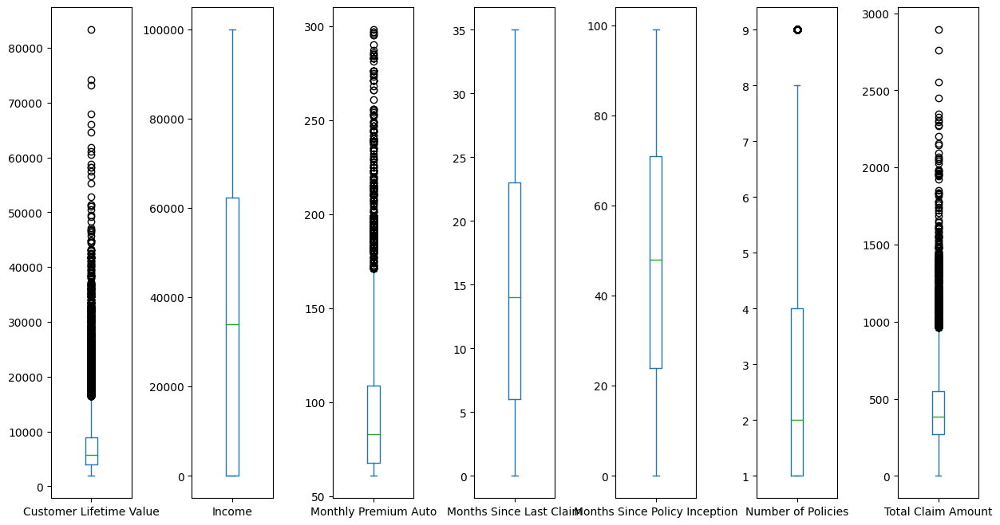

In [400]:
#eda
#use boxplot to visualise is there any outlier
df_num.plot(kind='box',subplots=True,sharey=False,figsize=(15,8))
plt.subplots_adjust(wspace=0.75)
plt.show()

In [401]:
#outliers is presenterd so outlier follow treatment
from feature_engine.outliers import Winsorizer

winser = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Customer Lifetime Value'])

df_num['Customer Lifetime Value'] = winser.fit_transform(df_num[['Customer Lifetime Value']])

C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13516\2141112944.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [402]:
winser = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Monthly Premium Auto'])

df_num['Monthly Premium Auto'] = winser.fit_transform(df_num[['Monthly Premium Auto']])

C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13516\440665470.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [403]:
winser = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Number of Policies'])

df_num['Number of Policies'] = winser.fit_transform(df_num[['Number of Policies']])

C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13516\1697110997.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [404]:
winser = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=['Total Claim Amount'])

df_num['Total Claim Amount'] = winser.fit_transform(df_num[['Total Claim Amount']])

C:\Users\J. Berger Perkins\AppData\Local\Temp\ipykernel_13516\1513261206.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



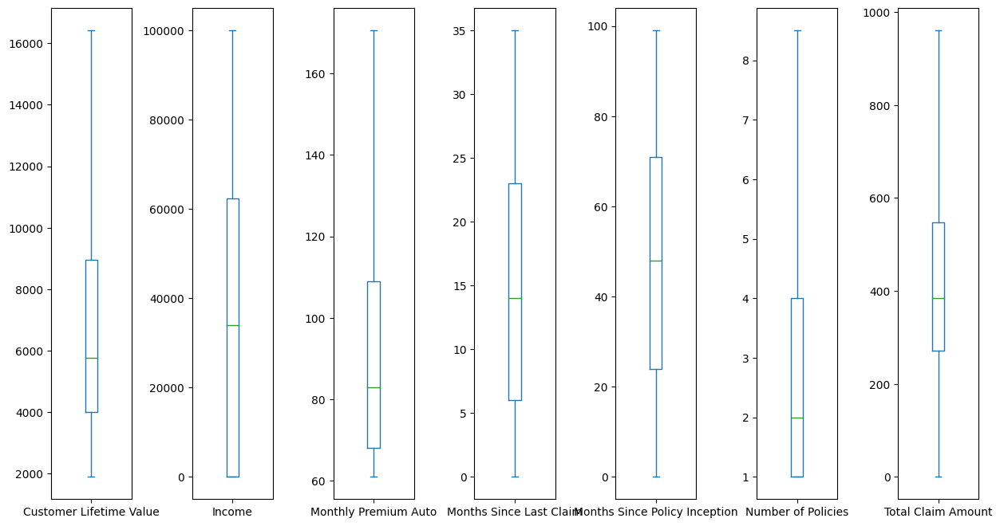

In [405]:
#Verify for outliers post the treatment
df_num.plot(kind='box',subplots=True,sharey=False,figsize=(15,8))
plt.subplots_adjust(wspace=0.75)
plt.show()

In [406]:
#zero and near zero variance
df_num.var()

Customer Lifetime Value          1.792766e+07
Income                           9.229386e+08
Monthly Premium Auto             8.074843e+02
Months Since Last Claim          1.014705e+02
Months Since Policy Inception    7.787443e+02
Number of Policies               5.449002e+00
Total Claim Amount               5.772211e+04
dtype: float64

In [407]:
df.dtypes

Customer                          object
State                             object
Customer Lifetime Value          float64
Response                          object
Coverage                          object
Effective To Date                 object
EmploymentStatus                  object
Gender                            object
Income                             int64
Location Code                     object
Marital Status                    object
Monthly Premium Auto               int64
Months Since Last Claim            int64
Months Since Policy Inception      int64
Number of Policies                 int64
Policy Type                       object
Policy                            object
Renew Offer Type                  object
Sales Channel                     object
Total Claim Amount               float64
Vehicle Class                     object
Vehicle Size                      object
dtype: object

In [411]:
#creating instance of label encoder 
#more than 10 values so use label encoder

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

In [427]:
df_cat = df_cat.apply(LabelEncoder().fit_transform)

In [428]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Customer           9134 non-null   int32
 1   State              9134 non-null   int32
 2   Response           9134 non-null   int32
 3   Coverage           9134 non-null   int32
 4   Effective To Date  9134 non-null   int32
 5   EmploymentStatus   9134 non-null   int32
 6   Gender             9134 non-null   int32
 7   Location Code      9134 non-null   int32
 8   Marital Status     9134 non-null   int32
 9   Policy Type        9134 non-null   int32
 10  Policy             9134 non-null   int32
 11  Renew Offer Type   9134 non-null   int32
 12  Sales Channel      9134 non-null   int32
 13  Vehicle Class      9134 non-null   int32
 14  Vehicle Size       9134 non-null   int32
dtypes: int32(15)
memory usage: 535.3 KB


In [429]:
df_cat.head()

,Customer,State,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Location Code,Marital Status,Policy Type,Policy,Renew Offer Type,Sales Channel,Vehicle Class,Vehicle Size
0,600,4,0,0,40,1,0,1,1,0,2,0,0,5,1
1,5946,0,0,1,20,4,0,1,2,1,5,2,0,0,1
2,96,2,0,2,34,1,0,1,1,1,5,0,0,5,1
3,8016,1,0,0,9,4,1,1,1,0,1,0,2,3,1
4,2488,4,0,0,46,1,1,0,2,1,3,0,0,0,1


In [430]:
# The dimension of the dataset after One-Hot Encoding

df_cat.shape

(9134, 15)

In [431]:
#graphical representation
df_num.columns

Index(['Customer Lifetime Value', 'Income', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Policies', 'Total Claim Amount'],
      dtype='object')

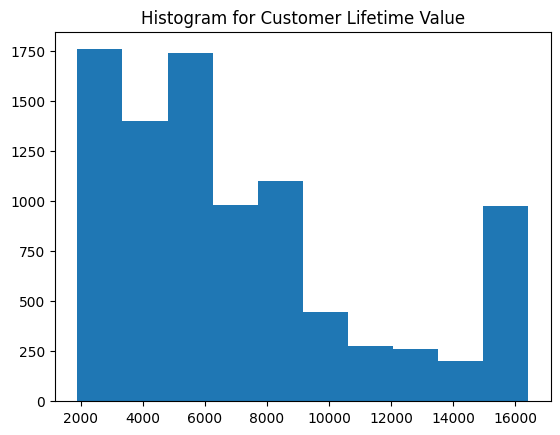

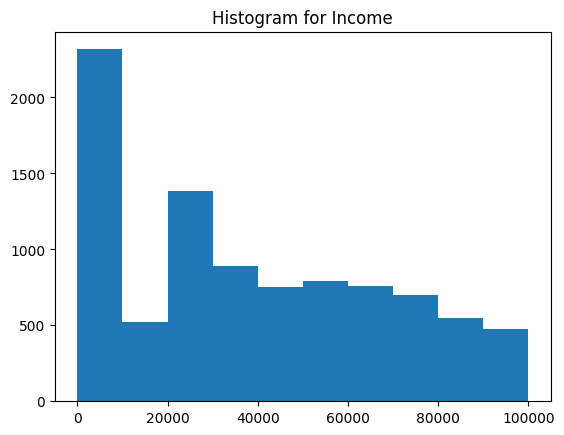

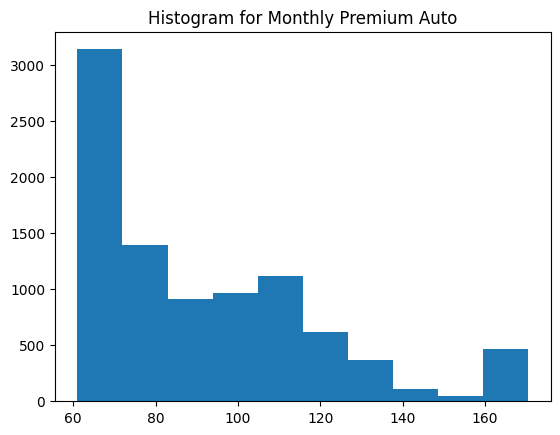

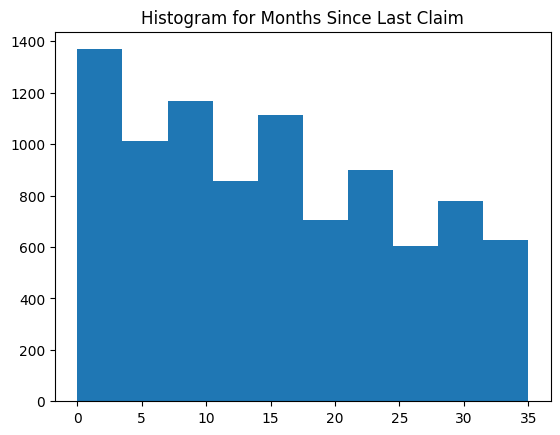

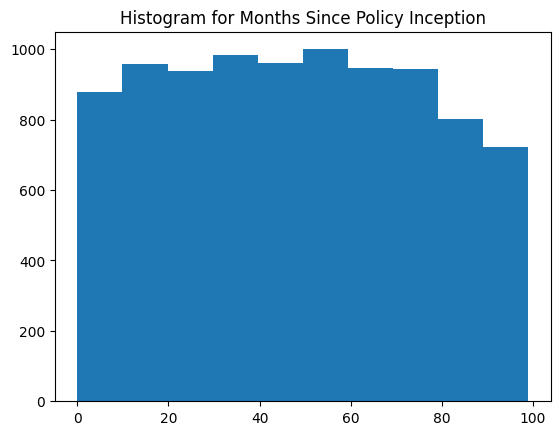

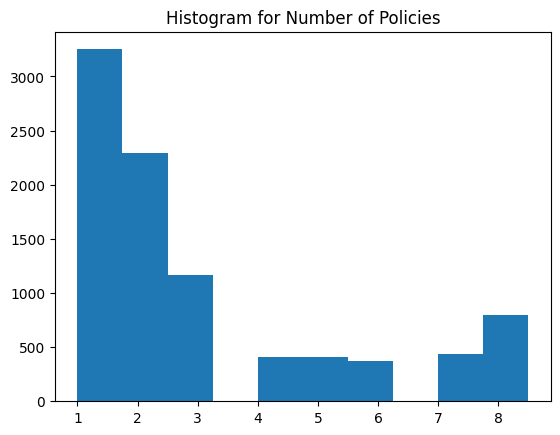

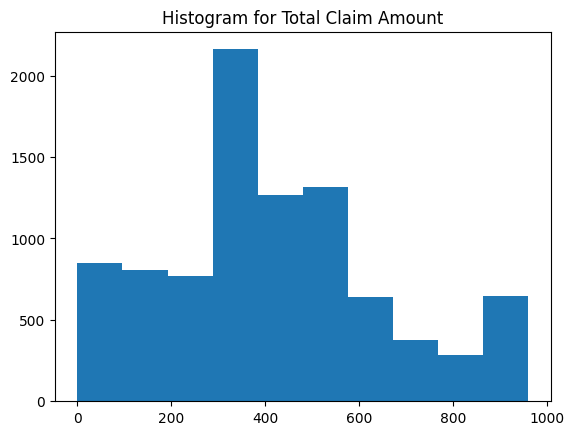

In [432]:
# Histogram describes the spread of data

for i in df_num.columns:
  plt.hist(x = df_num[i])
  plt.title("Histogram for " + str(i))
  plt.show()

((array([-3.78815982, -3.56175146, -3.43739314, ...,  3.43739314,
          3.56175146,  3.78815982]),
  array([ 1898.007675  ,  1898.683686  ,  1904.000852  , ...,
         16414.03991175, 16414.03991175, 16414.03991175])),
 (3959.5479575502036, 7185.701022054055, 0.934843493267907))

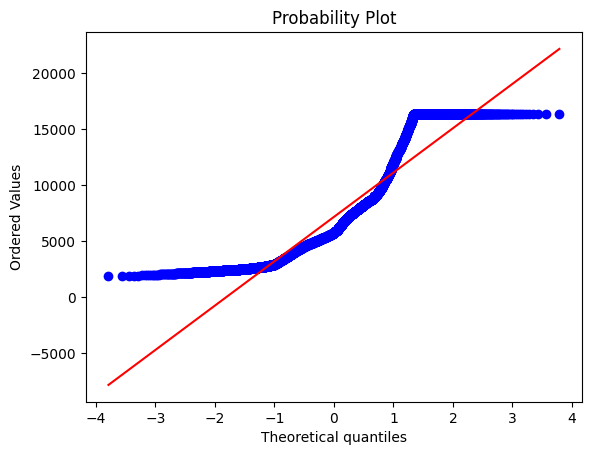

In [433]:
# Normal Quantile-Quantile Plot - Helps in understanding the distribution of the data - Normal distribution or not
import scipy.stats as stats
import pylab

# Checking whether data is normally distributed
stats.probplot(df_num['Customer Lifetime Value'], dist = "norm", plot = pylab)

((array([-3.78815982, -3.56175146, -3.43739314, ...,  3.43739314,
          3.56175146,  3.78815982]),
  array([    0,     0,     0, ..., 99960, 99961, 99981], dtype=int64)),
 (29179.954360504278, 37657.380008758475, 0.9601815245548406))

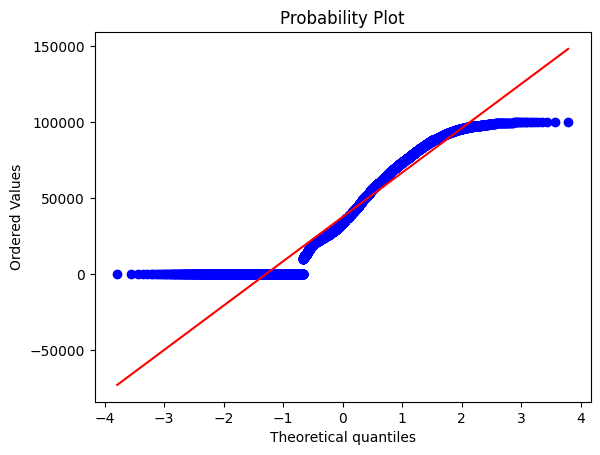

In [434]:
# Checking whether data is normally distributed
stats.probplot(df_num['Income'], dist = "norm", plot = pylab)

((array([-3.78815982, -3.56175146, -3.43739314, ...,  3.43739314,
          3.56175146,  3.78815982]),
  array([ 61. ,  61. ,  61. , ..., 170.5, 170.5, 170.5])),
 (26.45299726939481, 91.49463542807095, 0.9305998949241805))

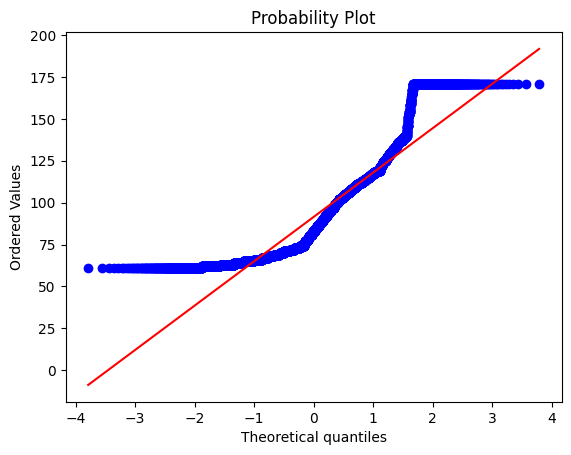

In [435]:
# Checking whether data is normally distributed
stats.probplot(df_num['Monthly Premium Auto'], dist = "norm", plot = pylab)

((array([-3.78815982, -3.56175146, -3.43739314, ...,  3.43739314,
          3.56175146,  3.78815982]),
  array([ 0,  0,  0, ..., 35, 35, 35], dtype=int64)),
 (9.823701814587842, 15.097000218962117, 0.9749007854843885))

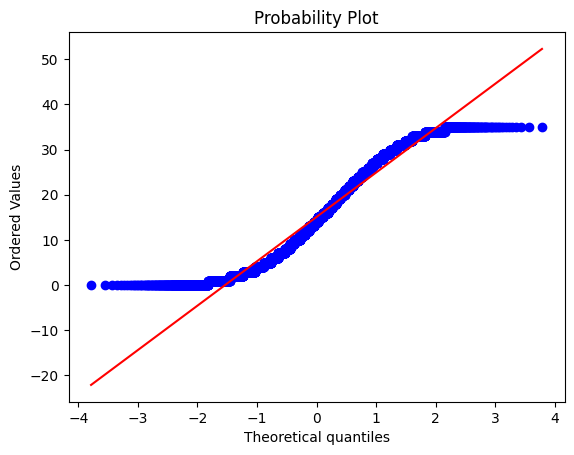

In [436]:
# Checking whether data is normally distributed
stats.probplot(df_num['Months Since Last Claim'], dist = "norm", plot = pylab)

((array([-3.78815982, -3.56175146, -3.43739314, ...,  3.43739314,
          3.56175146,  3.78815982]),
  array([ 0,  0,  0, ..., 99, 99, 99], dtype=int64)),
 (27.37489144011528, 48.06459382526822, 0.980641128216611))

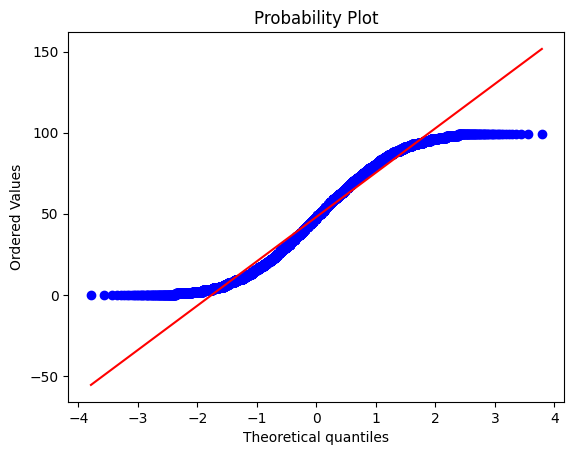

In [437]:
# Checking whether data is normally distributed
stats.probplot(df_num['Months Since Policy Inception'], dist = "norm", plot = pylab)

((array([-3.78815982, -3.56175146, -3.43739314, ...,  3.43739314,
          3.56175146,  3.78815982]),
  array([1. , 1. , 1. , ..., 8.5, 8.5, 8.5])),
 (2.064633045272656, 2.943398292095467, 0.8841776399774718))

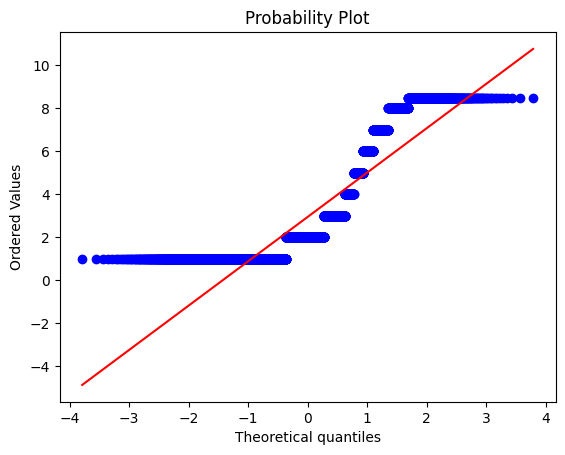

In [438]:
# Checking whether data is normally distributed
stats.probplot(df_num['Number of Policies'], dist = "norm", plot = pylab)

((array([-3.78815982, -3.56175146, -3.43739314, ...,  3.43739314,
          3.56175146,  3.78815982]),
  array([9.9007000e-02, 3.8210700e-01, 4.2331000e-01, ..., 9.6039973e+02,
         9.6039973e+02, 9.6039973e+02])),
 (235.6474809626163, 418.3221580595166, 0.9804983362711943))

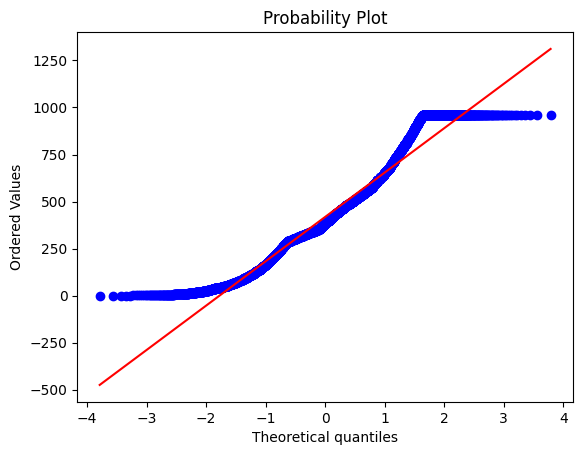

In [439]:
# Checking whether data is normally distributed
stats.probplot(df_num['Total Claim Amount'], dist = "norm", plot = pylab)

In [440]:
# concatinate entire data
df1 = pd.concat([df_cat, df_num], axis = 1)  # Prezprocessed data for clustering
df1.head()

,Customer,State,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Location Code,Marital Status,Policy Type,Policy,Renew Offer Type,Sales Channel,Vehicle Class,Vehicle Size,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Total Claim Amount
0,600,4,0,0,40,1,0,1,1,0,2,0,0,5,1,2763.519279,56274,69.0,32,5,1.0,384.811147
1,5946,0,0,1,20,4,0,1,2,1,5,2,0,0,1,6979.535903,0,94.0,13,42,8.0,960.399730
2,96,2,0,2,34,1,0,1,1,1,5,0,0,5,1,12887.431650,48767,108.0,18,38,2.0,566.472247
3,8016,1,0,0,9,4,1,1,1,0,1,0,2,3,1,7645.861827,0,106.0,18,65,7.0,529.881344
4,2488,4,0,0,46,1,1,0,2,1,3,0,0,0,1,2813.692575,43836,73.0,12,44,1.0,138.130879


In [441]:
df1.shape

(9134, 22)

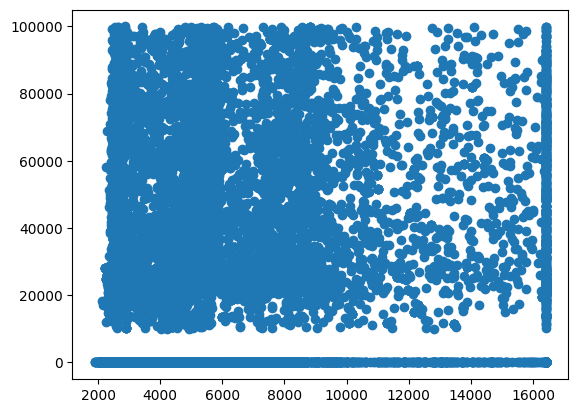

In [442]:
#bivariate analysis
#scatter plot
plt.scatter(x = df1['Customer Lifetime Value'], y = df1['Income']) 

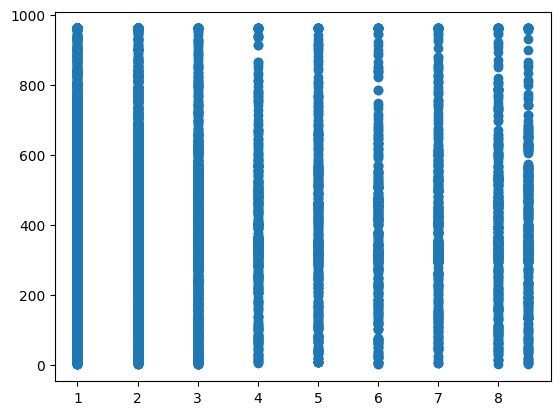

In [443]:
plt.scatter(x = df1['Number of Policies'], y = df1['Total Claim Amount']) 

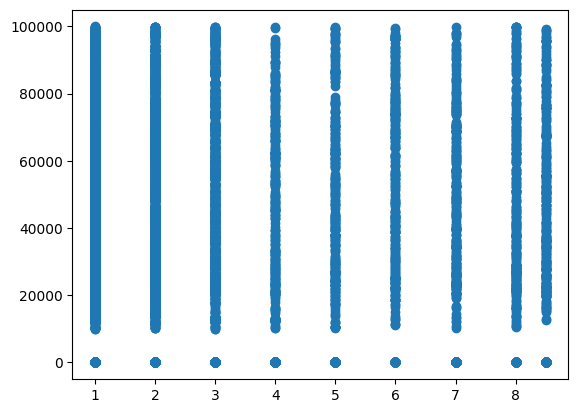

In [444]:
plt.scatter(x = df1['Number of Policies'], y = df1['Income']) 

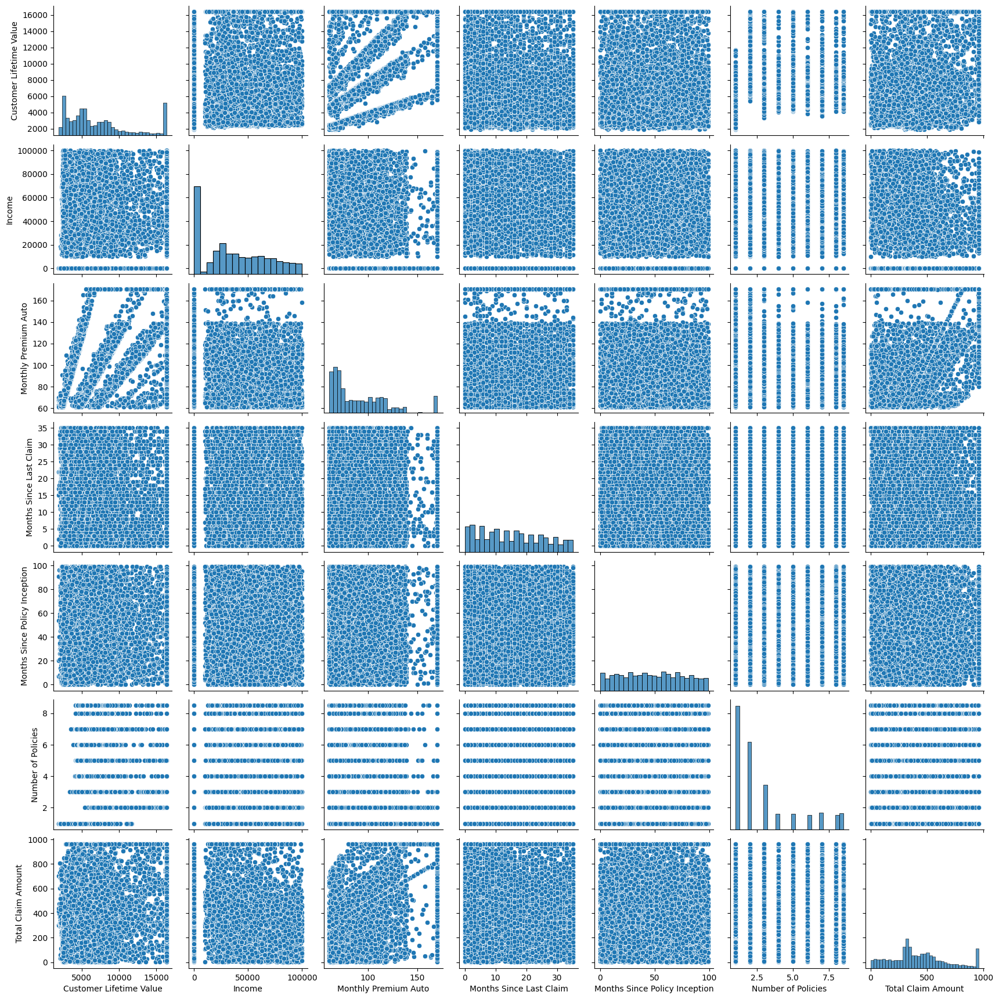

In [445]:
sns.pairplot(df_num)   # Use numerical variables for scatter plots

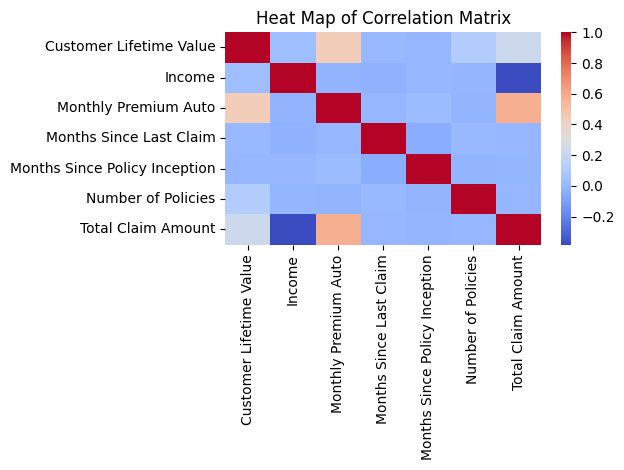

In [446]:
corrmatrix = df_num.corr(method = "pearson")

sns.heatmap(corrmatrix, xticklabels = corrmatrix.columns, yticklabels = corrmatrix.columns, cmap = "coolwarm")
plt.title('Heat Map of Correlation Matrix')
plt.tight_layout()
plt.show()

In [447]:
#scaling using normalization function
def norm_func(i):
    x = (i-i.min()) / (i.max()-i.min())
    return(x)

In [448]:
df_norm = norm_func(df1.iloc[:, 1:])

In [449]:
df_norm.describe()

,State,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Location Code,Marital Status,Policy Type,Policy,Renew Offer Type,Sales Channel,Vehicle Class,Vehicle Size,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Total Claim Amount
count,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000
mean,0.435434,0.143201,0.240311,0.493069,0.456427,0.490037,0.489545,0.560105,0.412963,0.474724,0.323407,0.367564,0.378476,0.544778,0.364266,0.376645,0.278490,0.431343,0.485501,0.259120,0.435513
std,0.321943,0.350297,0.327909,0.291878,0.336948,0.499928,0.302866,0.318419,0.237994,0.200747,0.335859,0.356484,0.414598,0.268656,0.291685,0.303857,0.259509,0.287807,0.281879,0.311241,0.250186
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.250000,0.000000,0.000000,0.241379,0.250000,0.000000,0.500000,0.500000,0.500000,0.375000,0.000000,0.000000,0.000000,0.500000,0.144409,0.000000,0.063927,0.171429,0.242424,0.000000,0.283410
50%,0.250000,0.000000,0.000000,0.482759,0.250000,0.000000,0.500000,0.500000,0.500000,0.500000,0.333333,0.333333,0.000000,0.500000,0.267440,0.338959,0.200913,0.400000,0.484848,0.133333,0.399715
75%,0.750000,0.000000,0.500000,0.741379,1.000000,1.000000,0.500000,1.000000,0.500000,0.625000,0.666667,0.666667,0.800000,0.500000,0.486645,0.623318,0.438356,0.657143,0.717172,0.400000,0.570046
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [450]:
##model building
#dendogram
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering 

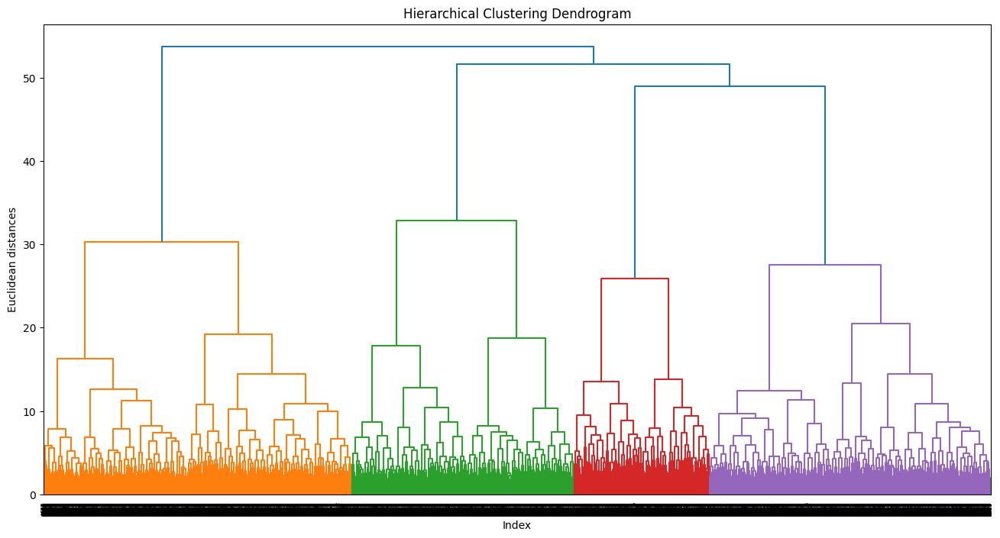

In [451]:
plt.figure(1, figsize = (16, 8))
tree_plot = dendrogram(linkage(df_norm, method  = "ward"))

plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Index')
plt.ylabel('Euclidean distances')
plt.show()

In [472]:
# Applying AgglomerativeClustering choosing 3 as clusters from the above dendrogram
hc1 = AgglomerativeClustering(n_clusters = 4, affinity = 'euclidean', linkage = 'complete')

y_hc1 = hc1.fit_predict(df_norm)
y_hc1

array([0, 2, 0, ..., 2, 0, 2], dtype=int64)

In [473]:
hc2 = AgglomerativeClustering(n_clusters = 4, affinity = 'euclidean', linkage = 'average')

y_hc2 = hc2.fit_predict(df_norm)
y_hc2

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [474]:
hc3 = AgglomerativeClustering(n_clusters = 4, affinity = 'euclidean', linkage = 'single')

y_hc3 = hc3.fit_predict(df_norm)
y_hc3

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [475]:
hc1.labels_   # Refering to the results obtained from linkage = 'complete' method

array([0, 2, 0, ..., 2, 0, 2], dtype=int64)

In [476]:
cluster_labels = pd.Series(hc1.labels_)

In [477]:
# Add Cluster labels to orignal Dataset

df['cluster'] = cluster_labels
df.head()


,Vehicle Class,Vehicle Size,cluster,Customer,State,Customer Lifetime Value,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount
0,Two-Door Car,Medsize,0,BU79786,Washington,2763.519279,No,Basic,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147
1,Four-Door Car,Medsize,2,QZ44356,Arizona,6979.535903,No,Extended,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935
2,Two-Door Car,Medsize,0,AI49188,Nevada,12887.431650,No,Premium,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,2,Personal Auto,Personal L3,Offer1,Agent,566.472247
3,SUV,Medsize,0,WW63253,California,7645.861827,No,Basic,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344
4,Four-Door Car,Medsize,0,HB64268,Washington,2813.692575,No,Basic,3/2/2011,Employed,M,43836,Rural,Single,73,12,44,1,Personal Auto,Personal L1,Offer1,Agent,138.130879


In [478]:
df.shape

(9134, 23)

In [479]:
df = df.iloc[:,[22,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21]]
df.head()

,Total Claim Amount,Vehicle Class,Vehicle Size,cluster,Customer,State,Customer Lifetime Value,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel
0,384.811147,Two-Door Car,Medsize,0,BU79786,Washington,2763.519279,No,Basic,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,1,Corporate Auto,Corporate L3,Offer1,Agent
1,1131.464935,Four-Door Car,Medsize,2,QZ44356,Arizona,6979.535903,No,Extended,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,8,Personal Auto,Personal L3,Offer3,Agent
2,566.472247,Two-Door Car,Medsize,0,AI49188,Nevada,12887.431650,No,Premium,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,2,Personal Auto,Personal L3,Offer1,Agent
3,529.881344,SUV,Medsize,0,WW63253,California,7645.861827,No,Basic,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,7,Corporate Auto,Corporate L2,Offer1,Call Center
4,138.130879,Four-Door Car,Medsize,0,HB64268,Washington,2813.692575,No,Basic,3/2/2011,Employed,M,43836,Rural,Single,73,12,44,1,Personal Auto,Personal L1,Offer1,Agent


In [480]:
df2 = df.sort_values(by = 'cluster')
df2

,Total Claim Amount,Vehicle Class,Vehicle Size,cluster,Customer,State,Customer Lifetime Value,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel
0,384.811147,Two-Door Car,Medsize,0,BU79786,Washington,2763.519279,No,Basic,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,1,Corporate Auto,Corporate L3,Offer1,Agent
5331,42.160829,Four-Door Car,Medsize,0,SK74843,Arizona,2442.422113,No,Basic,10/2/2011,Employed,F,57963,Rural,Divorced,61,11,63,1,Personal Auto,Personal L3,Offer2,Web
5330,492.935479,Two-Door Car,Small,0,GS26763,California,11633.578550,No,Extended,2/21/11,Employed,F,39669,Suburban,Married,98,13,63,2,Personal Auto,Personal L3,Offer2,Agent
5329,141.628547,Four-Door Car,Medsize,0,RX93631,Arizona,6438.971030,No,Extended,2/20/11,Employed,F,90035,Rural,Married,80,28,38,3,Personal Auto,Personal L3,Offer2,Call Center
5328,316.800000,Four-Door Car,Small,0,YP37291,Nevada,7854.771821,No,Basic,5/2/2011,Employed,M,36409,Suburban,Married,66,26,33,2,Personal Auto,Personal L3,Offer1,Branch
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2919,386.031248,Four-Door Car,Small,3,ZV32968,Oregon,7285.030983,Yes,Basic,2/28/11,Employed,M,44788,Suburban,Married,61,6,48,2,Personal Auto,Personal L3,Offer2,Agent
8459,828.000000,SUV,Medsize,3,EI17022,Washington,12168.744920,Yes,Basic,5/2/2011,Retired,M,14973,Suburban,Divorced,115,2,75,2,Corporate Auto,Corporate L3,Offer1,Branch
844,292.800000,Four-Door Car,Medsize,3,MW62634,California,2227.072755,Yes,Basic,5/1/2011,Retired,M,27972,Suburban,Married,61,7,38,1,Corporate Auto,Corporate L3,Offer3,Web
7569,425.266308,Four-Door Car,Medsize,3,MS46793,Oregon,2393.915369,Yes,Basic,1/31/11,Unemployed,M,0,Suburban,Single,70,24,10,1,Personal Auto,Personal L3,Offer1,Branch


In [481]:
#Aggregate the mean of each cluster
df2.iloc[:, 2:9].groupby(df2.cluster).mean()

,cluster,Customer Lifetime Value
cluster,,
0,0.0,7307.122950
1,1.0,12893.924741
2,2.0,7564.932293
3,3.0,7227.520607


In [482]:
cluster0 = df2.loc[(df2.cluster == 0), :]
cluster0

,Total Claim Amount,Vehicle Class,Vehicle Size,cluster,Customer,State,Customer Lifetime Value,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel
0,384.811147,Two-Door Car,Medsize,0,BU79786,Washington,2763.519279,No,Basic,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,1,Corporate Auto,Corporate L3,Offer1,Agent
5331,42.160829,Four-Door Car,Medsize,0,SK74843,Arizona,2442.422113,No,Basic,10/2/2011,Employed,F,57963,Rural,Divorced,61,11,63,1,Personal Auto,Personal L3,Offer2,Web
5330,492.935479,Two-Door Car,Small,0,GS26763,California,11633.578550,No,Extended,2/21/11,Employed,F,39669,Suburban,Married,98,13,63,2,Personal Auto,Personal L3,Offer2,Agent
5329,141.628547,Four-Door Car,Medsize,0,RX93631,Arizona,6438.971030,No,Extended,2/20/11,Employed,F,90035,Rural,Married,80,28,38,3,Personal Auto,Personal L3,Offer2,Call Center
5328,316.800000,Four-Door Car,Small,0,YP37291,Nevada,7854.771821,No,Basic,5/2/2011,Employed,M,36409,Suburban,Married,66,26,33,2,Personal Auto,Personal L3,Offer1,Branch
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2761,227.446260,Four-Door Car,Medsize,0,LE85123,Oregon,19237.770890,No,Basic,2/1/2011,Employed,M,35624,Urban,Single,66,6,55,2,Personal Auto,Personal L1,Offer1,Call Center
2963,32.508635,Four-Door Car,Medsize,0,HQ15974,Nevada,8262.879764,No,Extended,2/13/11,Unemployed,F,0,Rural,Married,76,4,51,2,Personal Auto,Personal L2,Offer1,Agent
3240,350.877502,SUV,Medsize,0,FW92569,Arizona,13270.944600,No,Basic,1/24/11,Employed,M,28727,Urban,Married,113,7,42,2,Corporate Auto,Corporate L1,Offer4,Branch
2579,140.819942,SUV,Medsize,0,YK16362,Arizona,10213.991110,No,Extended,8/1/2011,Employed,F,60078,Rural,Married,127,23,60,3,Corporate Auto,Corporate L1,Offer3,Branch


In [483]:
cluster1 = df2.loc[(df2.cluster == 1), :]
cluster1

,Total Claim Amount,Vehicle Class,Vehicle Size,cluster,Customer,State,Customer Lifetime Value,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel
8278,412.800000,Four-Door Car,Large,1,IL23615,Oregon,3350.244285,No,Extended,2/21/11,Employed,M,74770,Suburban,Single,86,23,10,1,Personal Auto,Personal L2,Offer2,Branch
6038,65.428481,Four-Door Car,Medsize,1,MS11057,Oregon,9587.586583,No,Premium,1/31/11,Employed,M,84539,Rural,Married,119,10,71,4,Personal Auto,Personal L3,Offer1,Call Center
6356,436.800000,Four-Door Car,Medsize,1,PE72696,California,10892.908250,No,Extended,7/1/2011,Employed,M,68025,Suburban,Divorced,91,15,17,2,Personal Auto,Personal L2,Offer1,Branch
2759,497.353106,Sports Car,Medsize,1,WE64781,Oregon,16922.125190,No,Extended,5/1/2011,Employed,F,93836,Urban,Married,139,1,19,2,Corporate Auto,Corporate L1,Offer3,Web
1868,329.522858,Four-Door Car,Medsize,1,MH81246,Oregon,7613.193095,No,Extended,2/17/11,Employed,M,36247,Urban,Married,96,35,29,7,Corporate Auto,Corporate L2,Offer1,Agent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8743,380.595522,Four-Door Car,Medsize,1,BC75105,California,2860.440918,No,Extended,1/23/11,Employed,M,45587,Urban,Divorced,81,8,49,1,Personal Auto,Personal L3,Offer3,Agent
2452,558.433218,Luxury Car,Medsize,1,ZW10467,Arizona,16107.190040,No,Basic,1/16/11,Employed,F,63288,Urban,Married,199,12,92,5,Personal Auto,Personal L1,Offer1,Web
9041,302.458432,Four-Door Car,Medsize,1,WN91223,California,11073.105720,No,Extended,2/1/2011,Employed,M,82807,Urban,Divorced,92,15,20,2,Personal Auto,Personal L3,Offer3,Agent
424,537.600000,Four-Door Car,Medsize,1,RM24280,Oregon,4177.696973,No,Premium,3/2/2011,Unemployed,F,0,Suburban,Married,112,4,49,1,Personal Auto,Personal L2,Offer3,Agent


In [484]:
cluster2 = df2.loc[(df2.cluster == 2), :]
cluster2

,Total Claim Amount,Vehicle Class,Vehicle Size,cluster,Customer,State,Customer Lifetime Value,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel
3925,302.400000,Four-Door Car,Medsize,2,JA12995,Oregon,2325.259483,No,Basic,2/15/11,Unemployed,F,0,Suburban,Married,63,6,75,1,Personal Auto,Personal L3,Offer3,Agent
8834,358.985713,Two-Door Car,Medsize,2,XQ19310,California,5006.609577,No,Basic,1/16/11,Unemployed,F,0,Suburban,Single,71,16,4,5,Personal Auto,Personal L3,Offer2,Call Center
7626,296.637382,Two-Door Car,Medsize,2,XK20264,Washington,9227.945752,No,Extended,2/28/11,Unemployed,F,0,Urban,Married,82,22,62,2,Personal Auto,Personal L3,Offer1,Call Center
3908,1258.327804,SUV,Medsize,2,AA10041,California,7901.744238,No,Basic,2/2/2011,Unemployed,M,0,Suburban,Single,113,35,83,5,Personal Auto,Personal L3,Offer1,Call Center
8806,504.000000,Four-Door Car,Small,2,HK84372,California,2409.700700,No,Basic,6/2/2011,Unemployed,M,0,Suburban,Single,70,14,95,1,Personal Auto,Personal L2,Offer1,Agent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1119,1149.203884,SUV,Medsize,2,NF35573,Oregon,11039.316170,No,Basic,3/1/2011,Unemployed,M,0,Suburban,Married,103,4,67,2,Special Auto,Special L3,Offer2,Call Center
1524,406.999443,Four-Door Car,Medsize,2,JW24035,Oregon,6852.001946,No,Basic,1/13/11,Unemployed,M,0,Suburban,Single,69,7,45,2,Personal Auto,Personal L2,Offer2,Branch
1144,541.561209,Four-Door Car,Medsize,2,PB11270,Oregon,7107.655397,No,Basic,2/24/11,Unemployed,F,0,Suburban,Married,61,2,15,2,Personal Auto,Personal L2,Offer1,Agent
7258,457.169818,Four-Door Car,Medsize,2,HC31007,California,5049.118385,No,Basic,5/1/2011,Unemployed,M,0,Suburban,Married,68,35,65,7,Personal Auto,Personal L2,Offer1,Agent


In [485]:
cluster3 = df2.loc[(df2.cluster == 3), :]
cluster3

,Total Claim Amount,Vehicle Class,Vehicle Size,cluster,Customer,State,Customer Lifetime Value,Response,Coverage,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel
201,590.400000,SUV,Medsize,3,RV14138,Nevada,4334.064096,Yes,Extended,2/27/11,Retired,F,23904,Suburban,Single,123,1,67,1,Personal Auto,Personal L3,Offer1,Agent
7520,412.800000,Four-Door Car,Medsize,3,XO92596,California,6005.847375,Yes,Extended,2/23/11,Retired,M,13528,Suburban,Single,86,21,35,3,Personal Auto,Personal L3,Offer1,Agent
7315,302.400000,Four-Door Car,Large,3,XT35473,Arizona,2300.691547,Yes,Basic,1/15/11,Retired,M,25905,Suburban,Divorced,63,21,12,1,Personal Auto,Personal L3,Offer1,Agent
7518,57.712985,Sports Car,Medsize,3,PF81183,California,5389.499465,Yes,Extended,7/1/2011,Employed,M,66429,Rural,Married,136,35,93,1,Corporate Auto,Corporate L2,Offer2,Agent
2234,57.712985,Sports Car,Medsize,3,TW94555,Nevada,5389.499465,Yes,Extended,7/1/2011,Employed,M,66429,Rural,Married,136,35,93,1,Personal Auto,Personal L3,Offer2,Agent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2919,386.031248,Four-Door Car,Small,3,ZV32968,Oregon,7285.030983,Yes,Basic,2/28/11,Employed,M,44788,Suburban,Married,61,6,48,2,Personal Auto,Personal L3,Offer2,Agent
8459,828.000000,SUV,Medsize,3,EI17022,Washington,12168.744920,Yes,Basic,5/2/2011,Retired,M,14973,Suburban,Divorced,115,2,75,2,Corporate Auto,Corporate L3,Offer1,Branch
844,292.800000,Four-Door Car,Medsize,3,MW62634,California,2227.072755,Yes,Basic,5/1/2011,Retired,M,27972,Suburban,Married,61,7,38,1,Corporate Auto,Corporate L3,Offer3,Web
7569,425.266308,Four-Door Car,Medsize,3,MS46793,Oregon,2393.915369,Yes,Basic,1/31/11,Unemployed,M,0,Suburban,Single,70,24,10,1,Personal Auto,Personal L3,Offer1,Branch
